<a href="https://colab.research.google.com/github/OJB-Quantum/Notebooks-for-Ideas/blob/main/Nanoscale_Technology_Tree_by_Onri_in_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Authored by Onri Jay Benally (2026)

Open Access (CC-BY-4.0)

In [ ]:
!uv pip install graphviz matplotlib

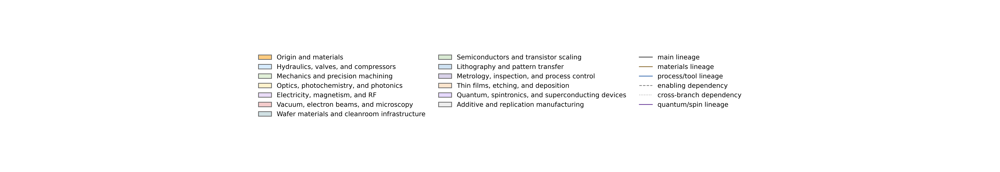

DOT written to: /content/nanoscale_manufacturing_lineage_connection_complete.dot
Graph written to: /content/nanoscale_manufacturing_lineage_connection_complete.png


In [ ]:
"""Render a connection-complete dependency DAG for nanoscale manufacturing.

The diagram is organized as a directed acyclic graph (DAG). The edge direction means
that an earlier technology, scientific result, material capability, process tool, or
manufacturing discipline enabled a later technology. The graph includes primary
genealogy edges, process lineage edges, materials edges, cross-branch enabling
edges, and added semiconductor-fab infrastructure needed to make the nanoscale
manufacturing tree more complete.
"""

import hashlib
import io
import re
import textwrap
from collections import OrderedDict, defaultdict, deque
from dataclasses import dataclass
from pathlib import Path
from typing import Final

import graphviz
import matplotlib as mpl
from graphviz.backend import execute
from matplotlib import image as mpimg
from matplotlib import patches as mpatches
from matplotlib import pyplot as plt

try:
    from IPython.display import SVG, display
except ImportError:  # pragma: no cover
    SVG = None
    display = None

try:
    from google.colab import files as colab_files
except ImportError:  # pragma: no cover
    colab_files = None


# -----------------------------------------------------------------------------
# Control knobs.
# -----------------------------------------------------------------------------
GRAPH_TITLE: Final[str] = (
    "Technology Timeline for Nanoscale Manufacturing by Onri Jay Benally (2026)"
)
RESOLUTION_DPI: Final[int] = 500
FONT_PRIMARY: Final[str] = "DejaVu Sans"
FONT_FALLBACKS: Final[list[str]] = ["Tahoma", "DejaVu Sans"]
FONT_WEIGHT: Final[str] = "normal"

LAYOUT_ENGINE: Final[str] = "dot"
OUTPUT_FORMAT: Final[str] = "png"  # Use "svg" for crisp Colab zoom or "png".
GRAPH_DIRECTION: Final[str] = "TB"
EDGE_SPLINE_MODE: Final[str] = "polyline"
FALLBACK_EDGE_SPLINE_MODES: Final[tuple[str, ...]] = (
    "polyline",
    "spline",
    "line",
    "false",
)
RANK_SEPARATION: Final[str] = "1.14 equally"
NODE_SEPARATION: Final[str] = "0.20"
LABEL_WRAP_WIDTH: Final[int] = 32
DATE_LINE_WRAP_WIDTH: Final[int] = 36
SPLIT_DATE_PARENTHESES: Final[bool] = True
PRESERVE_SHORT_QUALIFIERS_IN_MAIN_LABEL: Final[bool] = True
SHOW_LANE_LEGEND: Final[bool] = True
SHOW_EDGE_LEGEND: Final[bool] = True
SHOW_EDGE_LABELS: Final[bool] = False

FIGURE_WIDTH_IN: Final[float] = 30.0
MIN_FIGURE_HEIGHT_IN: Final[float] = 16.0
MAX_FIGURE_HEIGHT_IN: Final[float] = 92.0

WRITE_GRAPH_FILES: Final[bool] = True
AUTO_DOWNLOAD_IN_COLAB: Final[bool] = False
OUTPUT_BASENAME: Final[str] = "nanoscale_manufacturing_lineage_connection_complete"
OUTPUT_DIRECTORY: Final[Path] = Path("/content")

ORIGIN_LABEL: Final[str] = "Control of Fire (~1,000,000 BCE)"

LANE_COLORS: Final[dict[str, str]] = {
    "Origin and materials": "#ffcc80",
    "Hydraulics, valves, and compressors": "#d7ecff",
    "Mechanics and precision machining": "#e2f0d9",
    "Optics, photochemistry, and photonics": "#fff2cc",
    "Electricity, magnetism, and RF": "#eadcf8",
    "Vacuum, electron beams, and microscopy": "#f4cccc",
    "Wafer materials and cleanroom infrastructure": "#d0e0e3",
    "Semiconductors and transistor scaling": "#d9ead3",
    "Lithography and pattern transfer": "#cfe2f3",
    "Metrology, inspection, and process control": "#d9d2e9",
    "Thin films, etching, and deposition": "#fce5cd",
    "Quantum, spintronics, and superconducting devices": "#e6d9ff",
    "Additive and replication manufacturing": "#eeeeee",
}

EDGE_STYLES: Final[dict[str, dict[str, str]]] = {
    "core": {
        "color": "#555555",
        "style": "solid",
        "penwidth": "1.20",
        "label": "main lineage",
    },
    "materials": {
        "color": "#8c6d31",
        "style": "solid",
        "penwidth": "1.05",
        "label": "materials lineage",
    },
    "process": {
        "color": "#386cb0",
        "style": "solid",
        "penwidth": "1.05",
        "label": "process/tool lineage",
    },
    "enables": {
        "color": "#777777",
        "style": "dashed",
        "penwidth": "0.95",
        "label": "enabling dependency",
    },
    "cross": {
        "color": "#999999",
        "style": "dotted",
        "penwidth": "0.85",
        "label": "cross-branch dependency",
    },
    "quantum": {
        "color": "#6a3d9a",
        "style": "solid",
        "penwidth": "1.05",
        "label": "quantum/spin lineage",
    },
}

DATE_HINT_PATTERN: Final[re.Pattern[str]] = re.compile(
    r"(?:BCE|CE|\b(?:1\d{3}|20\d{2})s?\b|"
    r"\b[3-9]\d{2}\s*(?:BCE|CE)\b|"
    r"\d{1,2}(?:st|nd|rd|th)\s*C\b|century|mill\.?|"
    r"late|early|mid|HVM|emerging|patent|systems|"
    r"adoption|commercialization|immersion|initial tools|→)",
    re.IGNORECASE,
)

THOUSANDS_DATE_PATTERN: Final[re.Pattern[str]] = re.compile(
    r"^\s*~?\d{1,3}(?:,\d{3})+",
)


@dataclass(frozen=True)
class DependencyEdge:
    """A directed dependency between two technology nodes."""

    parent: str
    child: str
    relation: str = "core"
    note: str = ""


# -----------------------------------------------------------------------------
# Environment configuration.
# -----------------------------------------------------------------------------
def configure_environment_parameters() -> None:
    """Configure Matplotlib display parameters for direct notebook rendering."""
    mpl.rcParams["figure.dpi"] = RESOLUTION_DPI
    mpl.rcParams["font.sans-serif"] = FONT_FALLBACKS
    mpl.rcParams["font.weight"] = FONT_WEIGHT


# -----------------------------------------------------------------------------
# Node and dependency data.
# -----------------------------------------------------------------------------
TIMELINE_NODES: Final[list[str]] = ['Control of Fire (~1,000,000 BCE)',
 'Polished Obsidian Mirror (6000–5500 BCE)',
 'Mud Plug Irrigation (~5500 BCE)',
 'Early Optical Lenses (~4000 BCE)',
 'Potter’s Wheel (~4000–3500 BCE)',
 'Wood/Stone Sluice Gate (~3500–3000 BCE)',
 'Pictorial Wheeled Wagon (~3500–3350 BCE)',
 'Wooden Wheel + Axle (~3200 BCE)',
 'Tell Brak Eye Idols (Late 4th mill. BCE)',
 'Rock‑Crystal Inlaid Eyes (2600–2575 BCE)',
 'Minoan Rock‑Crystal Lenses (1600–1450 BCE)',
 'Bronze‑Age Workshop Lenses (1400–1200 BCE)',
 'Grass‑Fibre Jar Stopper (~1070 BCE)',
 'Leather Flap Check‑Valve (~1000 BCE)',
 'Nimrud/ Layard Lens (750–710 BCE)',
 'Discovery and early use of lodestone (natural magnetite, ~6th C BCE; compasses '
 '4th–2nd C BCE)',
 'Greek Theories of Optics (~5th C BCE)',
 'Natural‑Cork Stopper (1st C BCE)',
 'Roman Bronze Plug‑Valve (1st C BCE–1st C CE)',
 'Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
 'Roman Magnifying Devices (~1st C CE)',
 'Roman Lead‑Pipe Shut‑Offs (1st C CE)',
 'Wood milling, water‑powered sawmills (1st millennium CE →)',
 'Book of Optics (1021)',
 'Invention of Spectacles (13th C)',
 'Wooden Barrel Bung (1570s CE)',
 'Invention of the Telescope (1608)',
 'Reflecting Telescope (1668)',
 "Newton's “Opticks” (1704)",
 'Photochemical Experimentation (1717–1842; Schulze, Scheele, Wedgwood, Davy, '
 'Herschel)',
 'Achromatic Lens (1733)',
 'Wheel‑Blowing Cylinder (1762)',
 'Infra‑red Radiation (1800)',
 'Ultra‑violet Radiation (1801)',
 'Metal milling machines (1818–1820s; Whitney 1818)',
 'Discovery of Electromagnetism (1820)',
 'Invention of the Solenoid (1823)',
 'Compound Air Compressor (1829)',
 'DC Motor (1832)',
 'Practical Electric Motor (1837)',
 'Blueprinting (Cyanotype contact printing; reprography for plans) (1842; widely used '
 '19th–20th C)',
 'Mercury Displacement Pump (1855)',
 'Geissler Tube (1857)',
 "Maxwell's Equations (1864)",
 'Theory of Photographic Process (1873)',
 'Crookes Tube (~1875)',
 'Early Screw Compressor Patent (1878)',
 'Incandescent Light Bulb (1879)',
 'High‑voltage transformers for AC networks (1882–1885)',
 'Single‑phase AC induction motor (late‑1880s; in AC meters 1889)',
 'Photoelectric Effect (1887)',
 'Three‑phase AC induction motor (1889)',
 'Branly Coherer (1890)',
 'Lenard Window Tube (1894)',
 'Perrin Charge‑Collector / Cathode-Ray Charge (1895)',
 'Lodge & Popov Coherer (1895)',
 'Discovery of Electron (1897)',
 'Cathode‑Ray Tube (CRT, 1897)',
 'Industrial Plug/Gate/Check Valves (19–20th C)',
 "Planck's Quantum Theory (1900)",
 'Crystal Detector (~1901)',
 'Mercury Arc Rectifier (1902)',
 'Electron gun (thermionic/FEG; Wehnelt 1902–1903)',
 'Carbon‑Mic. Telephone Relay (1904)',
 'Fleming Valve (Vacuum Diode) (1904)',
 'Vacuum Tube (Thermionic) (1904)',
 'Einstein Photoelectric Eq. (1905)',
 'Scroll Compressor Concept (1905)',
 'Triode Vacuum Tube (1906)',
 'Mercury‑Vapor Neg‑Res Lamp (1906)',
 'de Forest Audion (Triode) (1906)',
 'Gaede Molecular Drag Pump (1913)',
 'Vacuum‑Tube Telephone Repeater (1913)',
 'Spinors (1913 → 1929)',
 'Diffusion Pump (1915)',
 'CRT magnetic deflection yoke (1920s–1930s)',
 'Radio‑frequency vacuum‑tube transceivers (two‑way radio, 1920s)',
 'Holweck Molecular Drag Pump (1923)',
 'Field‑Effect Transistor Concept (1925)',
 'Sintered permanent magnets (sintered Alnico 1930s; ferrite 1952; NdFeB 1983)',
 'Transmission Electron Microscopy (TEM, 1931)',
 'Twin‑Screw Compressor (1934)',
 'Heil FET Patent (1934)',
 'Modern Screw Compressor Patent (1935)',
 'Scanning Electron Microscopy (SEM, 1937 concept; practical instruments 1960s)',
 'Convergent‑Beam Electron Diffraction (CBED, 1939; 1970s →)',
 'Traveling Wave Tube (TWT) Amplifiers (1943)',
 'Electric Discharge Machining (EDM, 1943)',
 'Siegbahn Molecular Drag Pump (1944)',
 'Point‑Contact Transistor (1947)',
 'Bipolar Junction Transistor (1948)',
 'Electron‑Beam Evaporation (PVD, 1950s)',
 'MEMS/ NEMS (1950s →)',
 'Grown‑Junction Transistor (1951)',
 'Computer Numerical Control (CNC) machining (NC 1952; CNC 1970s)',
 'MASERs (1953)',
 'First Silicon Transistor (1954)',
 'Sputter Ion Pump (1957)',
 'Waterjet/ Abrasive‑waterjet cutting (1958 UHP; 1982 AWJ)',
 'Turbomolecular Pump (1958)',
 'Planar Process & MOSFET (1959)',
 'Integrated Circuits (Late 1950s)',
 'LASERs (1960)',
 'Gas LASERs (He–Ne) (1960)',
 'First solid‑state LASER (ruby) (1960)',
 'Contact Optical Lithography (1:1 shadow printing, early 1960s)',
 'Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
 'Early SOI Concepts (1960s)',
 'SEM scan/deflection coils (1960s)',
 'E‑beam deflection coils (vector scan; 1960s)',
 'Photonic Integrated Circuits (PICs; “integrated optics,” 1960s →)',
 'Thin‑Film Displays (1960s)',
 'Josephson Effect (JJ Theory 1962; Experimental 1963)',
 'LEDs (visible; 1962)',
 'Brushless DC motor (BLDC, 1962)',
 'Thin‑Film Transistors (1962)',
 'CMOS Technology (1963)',
 'Silicon‑on‑Sapphire (1963)',
 'Electron‑Beam Lithography (EBL, ~1965)',
 'LASER cutting (CO2, gas‑assist; 1965–1967 → 1970s)',
 'Optical Parametric Amplifiers (OPAs; 1965)',
 'Optical fiber (concept 1966; low‑loss 1970)',
 'Floating‑Gate MOSFET (1967)',
 'Metal‑Organic CVD (MOCVD, 1968)',
 'Molecular Beam Epitaxy (MBE, 1968–1970)',
 'Plasma‑Enhanced CVD (PECVD, late‑1960s/1970s)',
 'Wire Electric Discharge Machining (WEDM, ~1969)',
 'Scanning Transmission Electron Microscopy (STEM, 1970)',
 'Solid-State Microwave Low Noise Amplifiers (LNAs; 1970s)',
 'Cryopumps (1970s)',
 'Precision Machining Scroll Prototypes (1970s)',
 'Focused Ion Beam (FIB) Lithography/Milling (1970s)',
 'High‑Resolution TEM (HRTEM, 1970s; aberration‑corrected 1997–1999 →)',
 'Ion Beam Etching/Milling (IBE, 1970s)',
 'Microprocessors (1970s →)',
 'X‑ray Lithography (1972)',
 'Projection Optical Lithography (Micralign, 1973)',
 'Proximity Optical Lithography (gap “shadow” printing, 1973)',
 'Scroll Nitrogen Compressor R&D (1973)',
 'Magnetron Sputtering (planar high‑rate, 1974)',
 'Atomic Layer Deposition (ALD; “atomic layer epitaxy,” 1974)',
 'Magnetic Tunnel Junctions (MTJ; Julliere effect, 1975)',
 'Reactive Ion Etching (RIE, mid‑1970s)',
 'SPER SOI Process (1978)',
 'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
 'Commercial Scroll Compressors (Early 1980s)',
 'High‑Electron‑Mobility Transistor (HEMT, 1980)',
 'Optical‑fiber fusion splicing (first commercial splicers, 1980s)',
 'Screw Compressors in Korea (1980s)',
 'LASER Lithography (direct‑write & stepper, 1980s →)',
 'Micro‑molding (micro‑injection molding, 1980s–1990s)',
 'Micromachining (silicon bulk/surface micromachining, 1980s →)',
 'IBM SOI Research (1980s)',
 'Quantum dots (QDs; 1981/1983; manufacturable synthesis 1993)',
 'Resin 3D printing (SLA 1984/1986; DLP 1990s)',
 'Josephson Field-Effect Transistors (JJ FETs; 1985)',
 'Josephson Parametric Amplifiers (JPAs; 1989)',
 'Fused Deposition Modeling (FDM) 3D printing (1989 patent; 1992 systems)',
 'Spin Valves (GMR-based; 1991)',
 'Grayscale Lithography (dose‑modulated 3D resist, 1990s)',
 'Facing‑Target Magnetron Sputtering (FTS, 1990s adoption)',
 'High‑Density Plasma PECVD (HDP‑CVD, early 1990s)',
 'Cryogenic Reactive Ion Etching (cryo‑RIE, 1990s)',
 'FinFET Development (1990s)',
 'Peregrine SOS Process (1990)',
 'Two-Flow MOCVD (1990; patent 1991)',
 'Soitec Smart‑Cut SOI (1992)',
 'Blue LEDs (InGaN/GaN; 1993)',
 'Oil‑Free Scroll Air Compressors (1993)',
 'Metal sinter 3D printing (binder‑jet + sinter, 1993 concept; 2010s '
 'commercialization)',
 'Quantum‑dot LASERs (~1994)',
 'GaN LASERs (violet/blue diodes; 1995)',
 'Room-Temperature Magnetic Tunnel Junctions (1995)',
 'Nanoimprint Lithography (NIL, 1995)',
 'IBM Commercial SOI (1995)',
 'Spin-Transfer Torque (STT; Theory 1996)',
 'Two‑Photon Lithography/ Polymerization (1997)',
 'Nano‑molding (polymer nano‑replication, late‑1990s →)',
 'Fiber‑LASER cutting (late‑1990s concept; 2000s production)',
 'Metamaterials (Late 20th C)',
 'Thin‑Film LASERs (2000s)',
 'GaN LASER Lithography (violet 405 nm diode, 2000s →)',
 'Optical Metamaterial Waveguides (2000s)',
 'Thin‑Film Lumped Elements (2000s)',
 'Thin‑Film Distributed Elements (2000s)',
 'Thin‑Film Filters (2000s)',
 'Thin‑Film Sensors (2000s)',
 'Thin‑Film Interfaces (2000s)',
 'Ferromagnetic Josephson Junctions (Pi-junctions; 2001)',
 'Superconducting Metamaterials (2001)',
 'RF‑SOI (2001)',
 'FD‑SOI LSI (2002)',
 'Quantum Photonic Integrated Circuits (QPICs; 2008–2010s →)',
 'Voltage-Controlled Magnetic Anisotropy (VCMA) MTJs (2009)',
 'Cryogenic Atomic Layer Deposition (cryo‑ALD, 2010s–2020s; emerging)',
 'Cryogenic Atomic Layer Etching (cryo‑ALE, 2010s–2020s; emerging)',
 'Gate‑All‑Around (GAA) FET (2010s)',
 'Superconducting Metamaterial Waveguides (2010s)',
 'Voltage-Controlled Exchange Coupling (VCEC) MTJs (2010s)',
 'GaN LASER Lithography, near‑UV 375 nm (Raith PICOMASTER; 2010s →)',
 'Spin-Orbit Torque (SOT) MTJs (2011)',
 'GlobalFoundries & ST FD‑SOI (2012)',
 'Kinetic Inductance Traveling-Wave Parametric Amplifiers (KI-TWPAs; 2012)',
 'Microwave-to-Optical Quantum Transducers (2014)',
 'Samsung 28 FDS (2015)',
 'Josephson Traveling-Wave Parametric Amplifiers (JTWPAs; 2015)',
 'Atomic Layer Etching (ALE, mid‑2010s →)',
 'Metal fused deposition modeling (bound‑metal extrusion + sinter, 2016–2017)',
 'Superconducting Nonlinear Asymmetric Inductive Elements (SNAILs; 2017)',
 'FinFET‑on‑SOI (2017)',
 'Nanobridge Kinetic Parametric Amplifiers (KPAs; Late 2010s)',
 'Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
 'Nanosheet Transistors (2020s)',
 'Quantum Integrated Circuits (2020s)',
 'Quantum Dot Parametric Amplifiers (2020s)',
 'JJFET Parametric Amplifiers (2020s)',
 'Quantum Capacitance Parametric Amplifiers (2020s)',
 'Thin‑Film Energy Harvesters (2020s)',
 'Thin‑Film Solar Cells (2020s)',
 'Quantum IC/ Chiplets/ Modules (2020s)',
 'LASER balancing (ablation) for turbomolecular rotors (2021 →)',
 'High Numerical Aperture (High-NA) Extreme Ultraviolet (EUV) Lithography (0.55 NA; '
 '2023–2024 initial tools)',
 'X-rays (1895)',
 'Superconductivity (1911)',
 'Czochralski single-crystal growth method (1916)',
 'Electron spin and Stern-Gerlach experiment (1922)',
 'Quantum tunneling (1928)',
 'Bloch theorem and electron bands (1928)',
 'Band theory of solids (1928–1931)',
 'Spin polarization in ferromagnets (1920s–1930s)',
 'p-n junction theory and diode rectification (1930s–1940s)',
 'Semiconductor surface states and passivation physics (1940s–1950s)',
 'Metallurgical-grade silicon production (late 19th–20th C)',
 'Zone refining for ultra-pure semiconductors (1951)',
 'Semiconductor-grade polysilicon purification (Siemens process, 1950s)',
 'Quartz crucible and furnace materials for silicon growth (20th C)',
 'Float-zone silicon crystal growth (1950s)',
 'Czochralski silicon ingot growth for wafers (1950s →)',
 'Wafer preparation workflow (1950s →)',
 'Wafer slicing with inner-diameter and wire saws (1950s →)',
 'Wafer lapping and edge grinding (1950s →)',
 'Wafer chemical etching and damage removal (1950s →)',
 'Mirror wafer polishing (1950s →)',
 'Wafer cleaning and inspection (1950s →)',
 'Thermal oxidation of silicon (1950s →)',
 'Silicon dioxide surface passivation (1955–1959)',
 'Dopant diffusion furnaces (1950s →)',
 'Monolithic planar process control (1959 →)',
 'BCS theory of superconductivity (1957)',
 'Cleanroom contamination control (HEPA-filtered fabs, 1960s →)',
 'Cleanroom infrastructure for wafer fabs (1960s →)',
 'Ultra-pure process gases for semiconductor fabs (1960s →)',
 'Deionized and ultrapure water systems (1960s →)',
 'Photoresist chemistry for semiconductor lithography (1950s–1960s →)',
 'Chrome-on-glass photomasks (1950s–1960s →)',
 'Photomask aligners (1960s)',
 'Plasma processing for microfabrication (1960s →)',
 'Ion implantation for semiconductor doping (1960s →)',
 'Deal-Grove silicon oxidation model (1965)',
 'RCA wafer cleaning chemistry (1965)',
 'Automated photoresist coater-developer track systems (1970s–1980s →)',
 'Reticle and reduction-stepper mask technology (1970s–1980s →)',
 'Overlay alignment and registration control (1970s →)',
 'Surface profilometry and ellipsometry for thin films (1960s →)',
 'In-line wafer metrology and inspection (1970s →)',
 'Plasma ashing and photoresist stripping (1970s →)',
 'Excimer LASERs (1970)',
 'Excimer LASER Lithography (KrF 248 nm, early 1980s)',
 'Rapid thermal annealing (RTA, 1980s →)',
 'Scanning tunneling microscopy (STM, 1981)',
 'Atomic force microscopy (AFM, 1986)',
 'Critical-dimension SEM (CD-SEM, 1980s →)',
 'Chemically amplified resists (CAR, 1980s →)',
 'Phase-shift masks and optical proximity correction (1980s–1990s →)',
 'Chemical Mechanical Planarization (CMP, late 1980s →)',
 'Giant magnetoresistance (GMR, 1988)',
 'ArF Lithography (193 nm, 1990s →)',
 'Tunnel magnetoresistance in magnetic multilayers (1970s–1990s)',
 'Copper damascene interconnects (1997)',
 'EUV multilayer mirror optics (Mo/Si, 1980s–1990s →)',
 'ArF immersion lithography (193 nm immersion, 2004 →)',
 'Laser-produced plasma EUV source (tin droplets, 2000s →)',
 'EUV photomasks and reflective reticles (1990s–2000s →)',
 'EUV source and mask infrastructure (2000s–2010s →)',
 'EUV pellicles and mask defect control (2010s →)',
 'EUV resist stochastic control (2010s–2020s →)']

EDGE_ROWS: Final[list[tuple[str, str, str, str]]] = [('Control of Fire (~1,000,000 BCE)', 'Polished Obsidian Mirror (6000–5500 BCE)', 'materials', ''),
 ('Control of Fire (~1,000,000 BCE)', 'Mud Plug Irrigation (~5500 BCE)', 'core', ''),
 ('Control of Fire (~1,000,000 BCE)', 'Early Optical Lenses (~4000 BCE)', 'materials', ''),
 ('Control of Fire (~1,000,000 BCE)', 'Potter’s Wheel (~4000–3500 BCE)', 'materials', ''),
 ('Control of Fire (~1,000,000 BCE)', 'Pictorial Wheeled Wagon (~3500–3350 BCE)', 'core', ''),
 ('Control of Fire (~1,000,000 BCE)',
  'Discovery and early use of lodestone (natural magnetite, ~6th C BCE; compasses 4th–2nd C BCE)',
  'cross',
  ''),
 ('Control of Fire (~1,000,000 BCE)',
  'Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
  'materials',
  ''),
 ('Mud Plug Irrigation (~5500 BCE)', 'Wood/Stone Sluice Gate (~3500–3000 BCE)', 'core', ''),
 ('Wood/Stone Sluice Gate (~3500–3000 BCE)', 'Grass‑Fibre Jar Stopper (~1070 BCE)', 'core', ''),
 ('Grass‑Fibre Jar Stopper (~1070 BCE)', 'Leather Flap Check‑Valve (~1000 BCE)', 'core', ''),
 ('Leather Flap Check‑Valve (~1000 BCE)', 'Natural‑Cork Stopper (1st C BCE)', 'core', ''),
 ('Natural‑Cork Stopper (1st C BCE)', 'Roman Bronze Plug‑Valve (1st C BCE–1st C CE)', 'core', ''),
 ('Roman Bronze Plug‑Valve (1st C BCE–1st C CE)',
  'Roman Lead‑Pipe Shut‑Offs (1st C CE)',
  'core',
  ''),
 ('Roman Lead‑Pipe Shut‑Offs (1st C CE)',
  'Industrial Plug/Gate/Check Valves (19–20th C)',
  'core',
  ''),
 ('Potter’s Wheel (~4000–3500 BCE)', 'Wooden Barrel Bung (1570s CE)', 'materials', ''),
 ('Wooden Barrel Bung (1570s CE)', 'Wheel‑Blowing Cylinder (1762)', 'process', ''),
 ('Wheel‑Blowing Cylinder (1762)', 'Compound Air Compressor (1829)', 'process', ''),
 ('Compound Air Compressor (1829)', 'Early Screw Compressor Patent (1878)', 'process', ''),
 ('Early Screw Compressor Patent (1878)', 'Twin‑Screw Compressor (1934)', 'process', ''),
 ('Twin‑Screw Compressor (1934)', 'Modern Screw Compressor Patent (1935)', 'process', ''),
 ('Modern Screw Compressor Patent (1935)', 'Screw Compressors in Korea (1980s)', 'process', ''),
 ('Compound Air Compressor (1829)', 'Scroll Compressor Concept (1905)', 'process', ''),
 ('Scroll Compressor Concept (1905)',
  'Precision Machining Scroll Prototypes (1970s)',
  'process',
  ''),
 ('Precision Machining Scroll Prototypes (1970s)',
  'Scroll Nitrogen Compressor R&D (1973)',
  'process',
  ''),
 ('Scroll Nitrogen Compressor R&D (1973)',
  'Commercial Scroll Compressors (Early 1980s)',
  'process',
  ''),
 ('Commercial Scroll Compressors (Early 1980s)',
  'Oil‑Free Scroll Air Compressors (1993)',
  'process',
  ''),
 ('Compound Air Compressor (1829)',
  'Waterjet/ Abrasive‑waterjet cutting (1958 UHP; 1982 AWJ)',
  'process',
  ''),
 ('Industrial Plug/Gate/Check Valves (19–20th C)',
  'Mercury Displacement Pump (1855)',
  'process',
  ''),
 ('Compound Air Compressor (1829)', 'Mercury Displacement Pump (1855)', 'process', ''),
 ('Mercury Displacement Pump (1855)', 'Gaede Molecular Drag Pump (1913)', 'process', ''),
 ('Gaede Molecular Drag Pump (1913)', 'Diffusion Pump (1915)', 'process', ''),
 ('Diffusion Pump (1915)', 'Holweck Molecular Drag Pump (1923)', 'process', ''),
 ('Holweck Molecular Drag Pump (1923)', 'Siegbahn Molecular Drag Pump (1944)', 'process', ''),
 ('Siegbahn Molecular Drag Pump (1944)', 'Turbomolecular Pump (1958)', 'process', ''),
 ('Diffusion Pump (1915)', 'Sputter Ion Pump (1957)', 'process', ''),
 ('Turbomolecular Pump (1958)', 'Cryopumps (1970s)', 'process', ''),
 ('Turbomolecular Pump (1958)',
  'LASER balancing (ablation) for turbomolecular rotors (2021 →)',
  'process',
  ''),
 ('LASER cutting (CO2, gas‑assist; 1965–1967 → 1970s)',
  'LASER balancing (ablation) for turbomolecular rotors (2021 →)',
  'enables',
  ''),
 ('Pictorial Wheeled Wagon (~3500–3350 BCE)', 'Wooden Wheel + Axle (~3200 BCE)', 'core', ''),
 ('Wooden Wheel + Axle (~3200 BCE)',
  'Wood milling, water‑powered sawmills (1st millennium CE →)',
  'process',
  ''),
 ('Wood milling, water‑powered sawmills (1st millennium CE →)',
  'Metal milling machines (1818–1820s; Whitney 1818)',
  'process',
  ''),
 ('Metal milling machines (1818–1820s; Whitney 1818)',
  'Computer Numerical Control (CNC) machining (NC 1952; CNC 1970s)',
  'process',
  ''),
 ('Discovery of Electromagnetism (1820)',
  'Electric Discharge Machining (EDM, 1943)',
  'enables',
  ''),
 ('Metal milling machines (1818–1820s; Whitney 1818)',
  'Electric Discharge Machining (EDM, 1943)',
  'process',
  ''),
 ('Electric Discharge Machining (EDM, 1943)',
  'Wire Electric Discharge Machining (WEDM, ~1969)',
  'process',
  ''),
 ('Computer Numerical Control (CNC) machining (NC 1952; CNC 1970s)',
  'Waterjet/ Abrasive‑waterjet cutting (1958 UHP; 1982 AWJ)',
  'process',
  ''),
 ('Computer Numerical Control (CNC) machining (NC 1952; CNC 1970s)',
  'Micromachining (silicon bulk/surface micromachining, 1980s →)',
  'process',
  ''),
 ('Computer Numerical Control (CNC) machining (NC 1952; CNC 1970s)',
  'Micro‑molding (micro‑injection molding, 1980s–1990s)',
  'process',
  ''),
 ('Micro‑molding (micro‑injection molding, 1980s–1990s)',
  'Nano‑molding (polymer nano‑replication, late‑1990s →)',
  'process',
  ''),
 ('Nanoimprint Lithography (NIL, 1995)',
  'Nano‑molding (polymer nano‑replication, late‑1990s →)',
  'process',
  ''),
 ('MEMS/ NEMS (1950s →)',
  'Micromachining (silicon bulk/surface micromachining, 1980s →)',
  'process',
  ''),
 ('Photochemical Experimentation (1717–1842; Schulze, Scheele, Wedgwood, Davy, Herschel)',
  'Resin 3D printing (SLA 1984/1986; DLP 1990s)',
  'cross',
  ''),
 ('Resin 3D printing (SLA 1984/1986; DLP 1990s)',
  'Two‑Photon Lithography/ Polymerization (1997)',
  'process',
  ''),
 ('Fused Deposition Modeling (FDM) 3D printing (1989 patent; 1992 systems)',
  'Metal fused deposition modeling (bound‑metal extrusion + sinter, 2016–2017)',
  'process',
  ''),
 ('Metal milling machines (1818–1820s; Whitney 1818)',
  'Fused Deposition Modeling (FDM) 3D printing (1989 patent; 1992 systems)',
  'cross',
  ''),
 ('Sintered permanent magnets (sintered Alnico 1930s; ferrite 1952; NdFeB 1983)',
  'Metal sinter 3D printing (binder‑jet + sinter, 1993 concept; 2010s commercialization)',
  'materials',
  ''),
 ('Polished Obsidian Mirror (6000–5500 BCE)', 'Early Optical Lenses (~4000 BCE)', 'core', ''),
 ('Early Optical Lenses (~4000 BCE)', 'Tell Brak Eye Idols (Late 4th mill. BCE)', 'core', ''),
 ('Tell Brak Eye Idols (Late 4th mill. BCE)',
  'Rock‑Crystal Inlaid Eyes (2600–2575 BCE)',
  'core',
  ''),
 ('Rock‑Crystal Inlaid Eyes (2600–2575 BCE)',
  'Minoan Rock‑Crystal Lenses (1600–1450 BCE)',
  'core',
  ''),
 ('Minoan Rock‑Crystal Lenses (1600–1450 BCE)',
  'Bronze‑Age Workshop Lenses (1400–1200 BCE)',
  'core',
  ''),
 ('Bronze‑Age Workshop Lenses (1400–1200 BCE)', 'Nimrud/ Layard Lens (750–710 BCE)', 'core', ''),
 ('Nimrud/ Layard Lens (750–710 BCE)', 'Greek Theories of Optics (~5th C BCE)', 'core', ''),
 ('Greek Theories of Optics (~5th C BCE)',
  'Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
  'materials',
  ''),
 ('Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
  'Roman Magnifying Devices (~1st C CE)',
  'core',
  ''),
 ('Roman Magnifying Devices (~1st C CE)', 'Book of Optics (1021)', 'core', ''),
 ('Book of Optics (1021)', 'Invention of Spectacles (13th C)', 'core', ''),
 ('Invention of Spectacles (13th C)', 'Invention of the Telescope (1608)', 'core', ''),
 ('Invention of the Telescope (1608)', 'Reflecting Telescope (1668)', 'core', ''),
 ('Reflecting Telescope (1668)', "Newton's “Opticks” (1704)", 'core', ''),
 ("Newton's “Opticks” (1704)",
  'Photochemical Experimentation (1717–1842; Schulze, Scheele, Wedgwood, Davy, Herschel)',
  'core',
  ''),
 ("Newton's “Opticks” (1704)", 'Achromatic Lens (1733)', 'core', ''),
 ('Achromatic Lens (1733)', 'Infra‑red Radiation (1800)', 'core', ''),
 ('Achromatic Lens (1733)', 'Ultra‑violet Radiation (1801)', 'core', ''),
 ('Photochemical Experimentation (1717–1842; Schulze, Scheele, Wedgwood, Davy, Herschel)',
  'Blueprinting (Cyanotype contact printing; reprography for plans) (1842; widely used 19th–20th '
  'C)',
  'process',
  ''),
 ('Photochemical Experimentation (1717–1842; Schulze, Scheele, Wedgwood, Davy, Herschel)',
  'Theory of Photographic Process (1873)',
  'process',
  ''),
 ('Theory of Photographic Process (1873)',
  'Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'process',
  ''),
 ('Blueprinting (Cyanotype contact printing; reprography for plans) (1842; widely used 19th–20th '
  'C)',
  'Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'process',
  ''),
 ('Ultra‑violet Radiation (1801)',
  'Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'process',
  ''),
 ('Achromatic Lens (1733)', 'Projection Optical Lithography (Micralign, 1973)', 'enables', ''),
 ('Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'Projection Optical Lithography (Micralign, 1973)',
  'process',
  ''),
 ('Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'Proximity Optical Lithography (gap “shadow” printing, 1973)',
  'process',
  ''),
 ('Crookes Tube (~1875)', 'X‑ray Lithography (1972)', 'enables', ''),
 ('Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'X‑ray Lithography (1972)',
  'process',
  ''),
 ('Projection Optical Lithography (Micralign, 1973)',
  'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'process',
  ''),
 ('Ultra‑violet Radiation (1801)',
  'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'process',
  ''),
 ('Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)',
  'Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
  'enables',
  ''),
 ('Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
  'High Numerical Aperture (High-NA) Extreme Ultraviolet (EUV) Lithography (0.55 NA; 2023–2024 '
  'initial tools)',
  'process',
  ''),
 ('Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
  'Optical fiber (concept 1966; low‑loss 1970)',
  'materials',
  ''),
 ('Optical fiber (concept 1966; low‑loss 1970)',
  'Optical‑fiber fusion splicing (first commercial splicers, 1980s)',
  'process',
  ''),
 ('Optical fiber (concept 1966; low‑loss 1970)',
  'Photonic Integrated Circuits (PICs; “integrated optics,” 1960s →)',
  'enables',
  ''),
 ('Photonic Integrated Circuits (PICs; “integrated optics,” 1960s →)',
  'Quantum Photonic Integrated Circuits (QPICs; 2008–2010s →)',
  'quantum',
  ''),
 ('Discovery and early use of lodestone (natural magnetite, ~6th C BCE; compasses 4th–2nd C BCE)',
  'Discovery of Electromagnetism (1820)',
  'core',
  ''),
 ('Discovery of Electromagnetism (1820)', 'Invention of the Solenoid (1823)', 'core', ''),
 ('Discovery of Electromagnetism (1820)', "Maxwell's Equations (1864)", 'core', ''),
 ('Invention of the Solenoid (1823)', 'DC Motor (1832)', 'core', ''),
 ('DC Motor (1832)', 'Practical Electric Motor (1837)', 'core', ''),
 ('Practical Electric Motor (1837)',
  'High‑voltage transformers for AC networks (1882–1885)',
  'core',
  ''),
 ('High‑voltage transformers for AC networks (1882–1885)',
  'Single‑phase AC induction motor (late‑1880s; in AC meters 1889)',
  'core',
  ''),
 ('Single‑phase AC induction motor (late‑1880s; in AC meters 1889)',
  'Three‑phase AC induction motor (1889)',
  'core',
  ''),
 ('Three‑phase AC induction motor (1889)', 'Brushless DC motor (BLDC, 1962)', 'cross', ''),
 ('Brushless DC motor (BLDC, 1962)', 'Oil‑Free Scroll Air Compressors (1993)', 'enables', ''),
 ("Maxwell's Equations (1864)", 'Branly Coherer (1890)', 'core', ''),
 ('Branly Coherer (1890)', 'Lodge & Popov Coherer (1895)', 'core', ''),
 ('Lodge & Popov Coherer (1895)', 'Crystal Detector (~1901)', 'core', ''),
 ('Crystal Detector (~1901)', 'Field‑Effect Transistor Concept (1925)', 'enables', ''),
 ('High‑voltage transformers for AC networks (1882–1885)',
  'Mercury Arc Rectifier (1902)',
  'process',
  ''),
 ('Mercury Arc Rectifier (1902)', 'Mercury‑Vapor Neg‑Res Lamp (1906)', 'process', ''),
 ('Discovery of Electromagnetism (1820)', 'Carbon‑Mic. Telephone Relay (1904)', 'enables', ''),
 ("Maxwell's Equations (1864)",
  'Radio‑frequency vacuum‑tube transceivers (two‑way radio, 1920s)',
  'enables',
  ''),
 ('Radio‑frequency vacuum‑tube transceivers (two‑way radio, 1920s)',
  'Traveling Wave Tube (TWT) Amplifiers (1943)',
  'core',
  ''),
 ('Traveling Wave Tube (TWT) Amplifiers (1943)',
  'Solid-State Microwave Low Noise Amplifiers (LNAs; 1970s)',
  'cross',
  ''),
 ('Sintered permanent magnets (sintered Alnico 1930s; ferrite 1952; NdFeB 1983)',
  'Brushless DC motor (BLDC, 1962)',
  'materials',
  ''),
 ("Maxwell's Equations (1864)", 'Metamaterials (Late 20th C)', 'enables', ''),
 ('Discovery of Electromagnetism (1820)',
  'Sintered permanent magnets (sintered Alnico 1930s; ferrite 1952; NdFeB 1983)',
  'materials',
  ''),
 ('Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
  'Geissler Tube (1857)',
  'materials',
  ''),
 ('Mercury Displacement Pump (1855)', 'Geissler Tube (1857)', 'process', ''),
 ('Geissler Tube (1857)', 'Crookes Tube (~1875)', 'core', ''),
 ('Crookes Tube (~1875)', 'Incandescent Light Bulb (1879)', 'cross', ''),
 ('Crookes Tube (~1875)', 'Photoelectric Effect (1887)', 'core', ''),
 ('Crookes Tube (~1875)', 'Lenard Window Tube (1894)', 'core', ''),
 ('Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
  'Vacuum Tube (Thermionic) (1904)',
  'materials',
  ''),
 ('Incandescent Light Bulb (1879)', 'Fleming Valve (Vacuum Diode) (1904)', 'core', ''),
 ('Electron gun (thermionic/FEG; Wehnelt 1902–1903)',
  'Fleming Valve (Vacuum Diode) (1904)',
  'process',
  ''),
 ('Fleming Valve (Vacuum Diode) (1904)', 'Vacuum Tube (Thermionic) (1904)', 'core', ''),
 ('Vacuum Tube (Thermionic) (1904)', 'Triode Vacuum Tube (1906)', 'core', ''),
 ('Triode Vacuum Tube (1906)', 'de Forest Audion (Triode) (1906)', 'core', ''),
 ('de Forest Audion (Triode) (1906)', 'Vacuum‑Tube Telephone Repeater (1913)', 'core', ''),
 ('Carbon‑Mic. Telephone Relay (1904)', 'Vacuum‑Tube Telephone Repeater (1913)', 'cross', ''),
 ('Vacuum Tube (Thermionic) (1904)',
  'Radio‑frequency vacuum‑tube transceivers (two‑way radio, 1920s)',
  'core',
  ''),
 ('Lenard Window Tube (1894)', 'Cathode‑Ray Tube (CRT, 1897)', 'core', ''),
 ('Cathode‑Ray Tube (CRT, 1897)', 'Electron gun (thermionic/FEG; Wehnelt 1902–1903)', 'core', ''),
 ('Cathode‑Ray Tube (CRT, 1897)', 'CRT magnetic deflection yoke (1920s–1930s)', 'process', ''),
 ('CRT magnetic deflection yoke (1920s–1930s)', 'SEM scan/deflection coils (1960s)', 'enables', ''),
 ('CRT magnetic deflection yoke (1920s–1930s)',
  'E‑beam deflection coils (vector scan; 1960s)',
  'enables',
  ''),
 ('Electron gun (thermionic/FEG; Wehnelt 1902–1903)',
  'Transmission Electron Microscopy (TEM, 1931)',
  'process',
  ''),
 ('Diffusion Pump (1915)', 'Transmission Electron Microscopy (TEM, 1931)', 'process', ''),
 ("Maxwell's Equations (1864)", 'Transmission Electron Microscopy (TEM, 1931)', 'enables', ''),
 ('Transmission Electron Microscopy (TEM, 1931)',
  'Convergent‑Beam Electron Diffraction (CBED, 1939; 1970s →)',
  'process',
  ''),
 ('Transmission Electron Microscopy (TEM, 1931)',
  'Scanning Transmission Electron Microscopy (STEM, 1970)',
  'process',
  ''),
 ('Transmission Electron Microscopy (TEM, 1931)',
  'High‑Resolution TEM (HRTEM, 1970s; aberration‑corrected 1997–1999 →)',
  'process',
  ''),
 ('Electron gun (thermionic/FEG; Wehnelt 1902–1903)',
  'Scanning Electron Microscopy (SEM, 1937 concept; practical instruments 1960s)',
  'process',
  ''),
 ('SEM scan/deflection coils (1960s)',
  'Scanning Electron Microscopy (SEM, 1937 concept; practical instruments 1960s)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)',
  'Scanning Electron Microscopy (SEM, 1937 concept; practical instruments 1960s)',
  'enables',
  ''),
 ('Scanning Electron Microscopy (SEM, 1937 concept; practical instruments 1960s)',
  'Electron‑Beam Lithography (EBL, ~1965)',
  'process',
  ''),
 ('E‑beam deflection coils (vector scan; 1960s)',
  'Electron‑Beam Lithography (EBL, ~1965)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)', 'Electron‑Beam Lithography (EBL, ~1965)', 'enables', ''),
 ('Electron‑Beam Lithography (EBL, ~1965)', 'FinFET Development (1990s)', 'enables', ''),
 ('Scanning Electron Microscopy (SEM, 1937 concept; practical instruments 1960s)',
  'Focused Ion Beam (FIB) Lithography/Milling (1970s)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)',
  'Focused Ion Beam (FIB) Lithography/Milling (1970s)',
  'enables',
  ''),
 ('Focused Ion Beam (FIB) Lithography/Milling (1970s)',
  'Ion Beam Etching/Milling (IBE, 1970s)',
  'process',
  ''),
 ('Photoelectric Effect (1887)', 'Perrin Charge‑Collector / Cathode-Ray Charge (1895)', 'core', ''),
 ('Perrin Charge‑Collector / Cathode-Ray Charge (1895)',
  'Discovery of Electron (1897)',
  'core',
  ''),
 ('Discovery of Electron (1897)', "Planck's Quantum Theory (1900)", 'core', ''),
 ('Photoelectric Effect (1887)', 'Einstein Photoelectric Eq. (1905)', 'quantum', ''),
 ("Planck's Quantum Theory (1900)", 'Einstein Photoelectric Eq. (1905)', 'quantum', ''),
 ("Planck's Quantum Theory (1900)", 'Spinors (1913 → 1929)', 'quantum', ''),
 ('Triode Vacuum Tube (1906)', 'Point‑Contact Transistor (1947)', 'cross', ''),
 ("Planck's Quantum Theory (1900)", 'Point‑Contact Transistor (1947)', 'quantum', ''),
 ('Field‑Effect Transistor Concept (1925)', 'Heil FET Patent (1934)', 'core', ''),
 ('Heil FET Patent (1934)', 'Planar Process & MOSFET (1959)', 'enables', ''),
 ('Point‑Contact Transistor (1947)', 'Bipolar Junction Transistor (1948)', 'core', ''),
 ('Bipolar Junction Transistor (1948)', 'Grown‑Junction Transistor (1951)', 'core', ''),
 ('Grown‑Junction Transistor (1951)', 'First Silicon Transistor (1954)', 'core', ''),
 ('First Silicon Transistor (1954)', 'Planar Process & MOSFET (1959)', 'core', ''),
 ('Theory of Photographic Process (1873)', 'Planar Process & MOSFET (1959)', 'enables', ''),
 ('Planar Process & MOSFET (1959)', 'Integrated Circuits (Late 1950s)', 'core', ''),
 ('Integrated Circuits (Late 1950s)', 'Microprocessors (1970s →)', 'core', ''),
 ('Integrated Circuits (Late 1950s)', 'MEMS/ NEMS (1950s →)', 'enables', ''),
 ('Planar Process & MOSFET (1959)', 'CMOS Technology (1963)', 'core', ''),
 ('CMOS Technology (1963)', 'Microprocessors (1970s →)', 'core', ''),
 ('Planar Process & MOSFET (1959)', 'Floating‑Gate MOSFET (1967)', 'core', ''),
 ('Floating‑Gate MOSFET (1967)', 'Microprocessors (1970s →)', 'cross', ''),
 ("Planck's Quantum Theory (1900)", 'LEDs (visible; 1962)', 'quantum', ''),
 ('Planar Process & MOSFET (1959)', 'Early SOI Concepts (1960s)', 'core', ''),
 ('Early SOI Concepts (1960s)', 'Silicon‑on‑Sapphire (1963)', 'core', ''),
 ('Silicon‑on‑Sapphire (1963)', 'SPER SOI Process (1978)', 'process', ''),
 ('SPER SOI Process (1978)', 'IBM SOI Research (1980s)', 'process', ''),
 ('Silicon‑on‑Sapphire (1963)', 'Peregrine SOS Process (1990)', 'process', ''),
 ('IBM SOI Research (1980s)', 'Soitec Smart‑Cut SOI (1992)', 'process', ''),
 ('Soitec Smart‑Cut SOI (1992)', 'IBM Commercial SOI (1995)', 'process', ''),
 ('IBM Commercial SOI (1995)', 'RF‑SOI (2001)', 'process', ''),
 ('Peregrine SOS Process (1990)', 'RF‑SOI (2001)', 'process', ''),
 ('RF‑SOI (2001)', 'FD‑SOI LSI (2002)', 'process', ''),
 ('FD‑SOI LSI (2002)', 'GlobalFoundries & ST FD‑SOI (2012)', 'process', ''),
 ('GlobalFoundries & ST FD‑SOI (2012)', 'Samsung 28 FDS (2015)', 'process', ''),
 ('IBM Commercial SOI (1995)', 'FinFET‑on‑SOI (2017)', 'process', ''),
 ('FinFET Development (1990s)', 'FinFET‑on‑SOI (2017)', 'process', ''),
 ('Microprocessors (1970s →)', 'FinFET Development (1990s)', 'core', ''),
 ('Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'FinFET Development (1990s)',
  'process',
  ''),
 ('Atomic Layer Deposition (ALD; “atomic layer epitaxy,” 1974)',
  'FinFET Development (1990s)',
  'process',
  ''),
 ('Reactive Ion Etching (RIE, mid‑1970s)', 'FinFET Development (1990s)', 'process', ''),
 ('FinFET Development (1990s)', 'Gate‑All‑Around (GAA) FET (2010s)', 'core', ''),
 ('Gate‑All‑Around (GAA) FET (2010s)', 'Nanosheet Transistors (2020s)', 'core', ''),
 ('Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
  'Nanosheet Transistors (2020s)',
  'process',
  ''),
 ('Nanosheet Transistors (2020s)', 'Quantum IC/ Chiplets/ Modules (2020s)', 'enables', ''),
 ('Diffusion Pump (1915)', 'Electron‑Beam Evaporation (PVD, 1950s)', 'process', ''),
 ('Electron gun (thermionic/FEG; Wehnelt 1902–1903)',
  'Electron‑Beam Evaporation (PVD, 1950s)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)',
  'Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
  'enables',
  ''),
 ('Planar Process & MOSFET (1959)',
  'Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)', 'Thin‑Film Displays (1960s)', 'enables', ''),
 ('Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
  'Thin‑Film Transistors (1962)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)', 'Thin‑Film Transistors (1962)', 'enables', ''),
 ('Thin‑Film Transistors (1962)', 'Thin‑Film Displays (1960s)', 'process', ''),
 ('Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
  'Metal‑Organic CVD (MOCVD, 1968)',
  'process',
  ''),
 ('Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
  'Plasma‑Enhanced CVD (PECVD, late‑1960s/1970s)',
  'process',
  ''),
 ('Plasma‑Enhanced CVD (PECVD, late‑1960s/1970s)',
  'High‑Density Plasma PECVD (HDP‑CVD, early 1990s)',
  'process',
  ''),
 ('High‑Density Plasma PECVD (HDP‑CVD, early 1990s)', 'FinFET Development (1990s)', 'process', ''),
 ('Metal‑Organic CVD (MOCVD, 1968)', 'Two-Flow MOCVD (1990; patent 1991)', 'process', ''),
 ('Two-Flow MOCVD (1990; patent 1991)', 'Blue LEDs (InGaN/GaN; 1993)', 'process', ''),
 ('Blue LEDs (InGaN/GaN; 1993)', 'GaN LASERs (violet/blue diodes; 1995)', 'process', ''),
 ('GaN LASERs (violet/blue diodes; 1995)',
  'GaN LASER Lithography (violet 405 nm diode, 2000s →)',
  'process',
  ''),
 ('GaN LASER Lithography (violet 405 nm diode, 2000s →)',
  'GaN LASER Lithography, near‑UV 375 nm (Raith PICOMASTER; 2010s →)',
  'process',
  ''),
 ('Molecular Beam Epitaxy (MBE, 1968–1970)',
  'High‑Electron‑Mobility Transistor (HEMT, 1980)',
  'process',
  ''),
 ('Sputter Ion Pump (1957)', 'Molecular Beam Epitaxy (MBE, 1968–1970)', 'enables', ''),
 ('Turbomolecular Pump (1958)', 'Molecular Beam Epitaxy (MBE, 1968–1970)', 'enables', ''),
 ('Molecular Beam Epitaxy (MBE, 1968–1970)',
  'Quantum dots (QDs; 1981/1983; manufacturable synthesis 1993)',
  'process',
  ''),
 ('Quantum dots (QDs; 1981/1983; manufacturable synthesis 1993)',
  'Quantum‑dot LASERs (~1994)',
  'quantum',
  ''),
 ('Quantum‑dot LASERs (~1994)', 'Thin‑Film LASERs (2000s)', 'process', ''),
 ('Turbomolecular Pump (1958)',
  'Atomic Layer Deposition (ALD; “atomic layer epitaxy,” 1974)',
  'enables',
  ''),
 ('Atomic Layer Deposition (ALD; “atomic layer epitaxy,” 1974)',
  'Cryogenic Atomic Layer Deposition (cryo‑ALD, 2010s–2020s; emerging)',
  'process',
  ''),
 ('Atomic Layer Deposition (ALD; “atomic layer epitaxy,” 1974)',
  'Atomic Layer Etching (ALE, mid‑2010s →)',
  'process',
  ''),
 ('Atomic Layer Etching (ALE, mid‑2010s →)',
  'Cryogenic Atomic Layer Etching (cryo‑ALE, 2010s–2020s; emerging)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)', 'Reactive Ion Etching (RIE, mid‑1970s)', 'enables', ''),
 ('Reactive Ion Etching (RIE, mid‑1970s)',
  'Cryogenic Reactive Ion Etching (cryo‑RIE, 1990s)',
  'process',
  ''),
 ('Cryogenic Reactive Ion Etching (cryo‑RIE, 1990s)',
  'Gate‑All‑Around (GAA) FET (2010s)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)', 'Ion Beam Etching/Milling (IBE, 1970s)', 'enables', ''),
 ('Ion Beam Etching/Milling (IBE, 1970s)',
  'Magnetic Tunnel Junctions (MTJ; Julliere effect, 1975)',
  'process',
  ''),
 ('Sputter Ion Pump (1957)', 'Magnetron Sputtering (planar high‑rate, 1974)', 'process', ''),
 ('Magnetron Sputtering (planar high‑rate, 1974)',
  'Facing‑Target Magnetron Sputtering (FTS, 1990s adoption)',
  'process',
  ''),
 ('Magnetron Sputtering (planar high‑rate, 1974)',
  'Magnetic Tunnel Junctions (MTJ; Julliere effect, 1975)',
  'process',
  ''),
 ('Electron‑Beam Evaporation (PVD, 1950s)', 'Thin‑Film Lumped Elements (2000s)', 'process', ''),
 ('Electron‑Beam Evaporation (PVD, 1950s)',
  'Thin‑Film Distributed Elements (2000s)',
  'process',
  ''),
 ('Electron‑Beam Evaporation (PVD, 1950s)', 'Thin‑Film Filters (2000s)', 'process', ''),
 ('Electron‑Beam Evaporation (PVD, 1950s)', 'Thin‑Film Sensors (2000s)', 'process', ''),
 ('Electron‑Beam Evaporation (PVD, 1950s)', 'Thin‑Film Interfaces (2000s)', 'process', ''),
 ('Thin‑Film Interfaces (2000s)', 'Thin‑Film Energy Harvesters (2020s)', 'process', ''),
 ('Thin‑Film Interfaces (2000s)', 'Thin‑Film Solar Cells (2020s)', 'process', ''),
 ('Thin‑Film Lumped Elements (2000s)', 'Quantum IC/ Chiplets/ Modules (2020s)', 'enables', ''),
 ('Thin‑Film Distributed Elements (2000s)', 'Quantum IC/ Chiplets/ Modules (2020s)', 'enables', ''),
 ('Thin‑Film Filters (2000s)', 'Quantum IC/ Chiplets/ Modules (2020s)', 'enables', ''),
 ('Thin‑Film Interfaces (2000s)', 'Quantum IC/ Chiplets/ Modules (2020s)', 'enables', ''),
 ("Planck's Quantum Theory (1900)", 'MASERs (1953)', 'quantum', ''),
 ('MASERs (1953)', 'LASERs (1960)', 'quantum', ''),
 ('LASERs (1960)', 'Gas LASERs (He–Ne) (1960)', 'core', ''),
 ('LASERs (1960)', 'First solid‑state LASER (ruby) (1960)', 'core', ''),
 ('LASERs (1960)', 'Optical Parametric Amplifiers (OPAs; 1965)', 'quantum', ''),
 ('First solid‑state LASER (ruby) (1960)',
  'LASER Lithography (direct‑write & stepper, 1980s →)',
  'process',
  ''),
 ('LASERs (1960)', 'LASER cutting (CO2, gas‑assist; 1965–1967 → 1970s)', 'process', ''),
 ('LASER cutting (CO2, gas‑assist; 1965–1967 → 1970s)',
  'Fiber‑LASER cutting (late‑1990s concept; 2000s production)',
  'process',
  ''),
 ('Optical fiber (concept 1966; low‑loss 1970)',
  'Fiber‑LASER cutting (late‑1990s concept; 2000s production)',
  'materials',
  ''),
 ('LASER Lithography (direct‑write & stepper, 1980s →)',
  'Grayscale Lithography (dose‑modulated 3D resist, 1990s)',
  'process',
  ''),
 ('LASER Lithography (direct‑write & stepper, 1980s →)',
  'Two‑Photon Lithography/ Polymerization (1997)',
  'process',
  ''),
 ('LASER Lithography (direct‑write & stepper, 1980s →)',
  'GaN LASER Lithography (violet 405 nm diode, 2000s →)',
  'process',
  ''),
 ('Grayscale Lithography (dose‑modulated 3D resist, 1990s)',
  'Nanoimprint Lithography (NIL, 1995)',
  'cross',
  ''),
 ("Planck's Quantum Theory (1900)",
  'Josephson Effect (JJ Theory 1962; Experimental 1963)',
  'quantum',
  ''),
 ('Electron‑Beam Evaporation (PVD, 1950s)',
  'Josephson Effect (JJ Theory 1962; Experimental 1963)',
  'process',
  ''),
 ('Josephson Effect (JJ Theory 1962; Experimental 1963)',
  'Josephson Field-Effect Transistors (JJ FETs; 1985)',
  'quantum',
  ''),
 ('Josephson Effect (JJ Theory 1962; Experimental 1963)',
  'Josephson Parametric Amplifiers (JPAs; 1989)',
  'quantum',
  ''),
 ('Josephson Effect (JJ Theory 1962; Experimental 1963)',
  'Ferromagnetic Josephson Junctions (Pi-junctions; 2001)',
  'quantum',
  ''),
 ('Josephson Effect (JJ Theory 1962; Experimental 1963)',
  'Josephson Traveling-Wave Parametric Amplifiers (JTWPAs; 2015)',
  'quantum',
  ''),
 ('Josephson Field-Effect Transistors (JJ FETs; 1985)',
  'JJFET Parametric Amplifiers (2020s)',
  'quantum',
  ''),
 ('Josephson Parametric Amplifiers (JPAs; 1989)',
  'Superconducting Nonlinear Asymmetric Inductive Elements (SNAILs; 2017)',
  'quantum',
  ''),
 ('Superconducting Nonlinear Asymmetric Inductive Elements (SNAILs; 2017)',
  'Quantum Capacitance Parametric Amplifiers (2020s)',
  'quantum',
  ''),
 ('Traveling Wave Tube (TWT) Amplifiers (1943)',
  'Kinetic Inductance Traveling-Wave Parametric Amplifiers (KI-TWPAs; 2012)',
  'cross',
  ''),
 ('Traveling Wave Tube (TWT) Amplifiers (1943)',
  'Josephson Traveling-Wave Parametric Amplifiers (JTWPAs; 2015)',
  'cross',
  ''),
 ('Thin‑Film Distributed Elements (2000s)',
  'Kinetic Inductance Traveling-Wave Parametric Amplifiers (KI-TWPAs; 2012)',
  'process',
  ''),
 ('Kinetic Inductance Traveling-Wave Parametric Amplifiers (KI-TWPAs; 2012)',
  'Nanobridge Kinetic Parametric Amplifiers (KPAs; Late 2010s)',
  'quantum',
  ''),
 ('Quantum dots (QDs; 1981/1983; manufacturable synthesis 1993)',
  'Quantum Dot Parametric Amplifiers (2020s)',
  'quantum',
  ''),
 ('Magnetic Tunnel Junctions (MTJ; Julliere effect, 1975)',
  'Room-Temperature Magnetic Tunnel Junctions (1995)',
  'quantum',
  ''),
 ('Facing‑Target Magnetron Sputtering (FTS, 1990s adoption)',
  'Spin Valves (GMR-based; 1991)',
  'process',
  ''),
 ('Spin Valves (GMR-based; 1991)',
  'Room-Temperature Magnetic Tunnel Junctions (1995)',
  'quantum',
  ''),
 ('Room-Temperature Magnetic Tunnel Junctions (1995)',
  'Spin-Transfer Torque (STT; Theory 1996)',
  'quantum',
  ''),
 ('Spin-Transfer Torque (STT; Theory 1996)',
  'Voltage-Controlled Magnetic Anisotropy (VCMA) MTJs (2009)',
  'quantum',
  ''),
 ('Voltage-Controlled Magnetic Anisotropy (VCMA) MTJs (2009)',
  'Voltage-Controlled Exchange Coupling (VCEC) MTJs (2010s)',
  'quantum',
  ''),
 ('Spin-Transfer Torque (STT; Theory 1996)', 'Spin-Orbit Torque (SOT) MTJs (2011)', 'quantum', ''),
 ('Metamaterials (Late 20th C)', 'Optical Metamaterial Waveguides (2000s)', 'process', ''),
 ('Metamaterials (Late 20th C)', 'Superconducting Metamaterials (2001)', 'quantum', ''),
 ('Superconducting Metamaterials (2001)',
  'Superconducting Metamaterial Waveguides (2010s)',
  'quantum',
  ''),
 ('Superconducting Metamaterial Waveguides (2010s)',
  'Kinetic Inductance Traveling-Wave Parametric Amplifiers (KI-TWPAs; 2012)',
  'quantum',
  ''),
 ('Optical Metamaterial Waveguides (2000s)',
  'Microwave-to-Optical Quantum Transducers (2014)',
  'quantum',
  ''),
 ('Superconducting Metamaterial Waveguides (2010s)',
  'Microwave-to-Optical Quantum Transducers (2014)',
  'quantum',
  ''),
 ('Quantum Photonic Integrated Circuits (QPICs; 2008–2010s →)',
  'Quantum Integrated Circuits (2020s)',
  'quantum',
  ''),
 ('Microwave-to-Optical Quantum Transducers (2014)',
  'Quantum Integrated Circuits (2020s)',
  'quantum',
  ''),
 ('Quantum Integrated Circuits (2020s)', 'Quantum IC/ Chiplets/ Modules (2020s)', 'quantum', ''),
 ('Crookes Tube (~1875)',
  'X-rays (1895)',
  'core',
  'Crookes tube experiments led to X-ray discovery.'),
 ('X-rays (1895)',
  'X‑ray Lithography (1972)',
  'enables',
  'X-ray generation and optics enabled X-ray lithography.'),
 ('Discovery of Electron (1897)',
  'Electron spin and Stern-Gerlach experiment (1922)',
  'quantum',
  ''),
 ("Planck's Quantum Theory (1900)", 'Quantum tunneling (1928)', 'quantum', ''),
 ("Planck's Quantum Theory (1900)", 'Bloch theorem and electron bands (1928)', 'quantum', ''),
 ('Bloch theorem and electron bands (1928)', 'Band theory of solids (1928–1931)', 'quantum', ''),
 ('Band theory of solids (1928–1931)',
  'p-n junction theory and diode rectification (1930s–1940s)',
  'quantum',
  ''),
 ('Band theory of solids (1928–1931)', 'Point‑Contact Transistor (1947)', 'quantum', ''),
 ('p-n junction theory and diode rectification (1930s–1940s)',
  'Bipolar Junction Transistor (1948)',
  'quantum',
  ''),
 ('Semiconductor surface states and passivation physics (1940s–1950s)',
  'Silicon dioxide surface passivation (1955–1959)',
  'quantum',
  ''),
 ('Electron spin and Stern-Gerlach experiment (1922)', 'Spinors (1913 → 1929)', 'quantum', ''),
 ('Electron spin and Stern-Gerlach experiment (1922)',
  'Spin polarization in ferromagnets (1920s–1930s)',
  'quantum',
  ''),
 ('Spin polarization in ferromagnets (1920s–1930s)',
  'Giant magnetoresistance (GMR, 1988)',
  'quantum',
  ''),
 ('Giant magnetoresistance (GMR, 1988)', 'Spin Valves (GMR-based; 1991)', 'quantum', ''),
 ('Quantum tunneling (1928)',
  'Tunnel magnetoresistance in magnetic multilayers (1970s–1990s)',
  'quantum',
  ''),
 ('Spin polarization in ferromagnets (1920s–1930s)',
  'Tunnel magnetoresistance in magnetic multilayers (1970s–1990s)',
  'quantum',
  ''),
 ('Tunnel magnetoresistance in magnetic multilayers (1970s–1990s)',
  'Magnetic Tunnel Junctions (MTJ; Julliere effect, 1975)',
  'quantum',
  ''),
 ('Tunnel magnetoresistance in magnetic multilayers (1970s–1990s)',
  'Room-Temperature Magnetic Tunnel Junctions (1995)',
  'quantum',
  ''),
 ('Superconductivity (1911)', 'BCS theory of superconductivity (1957)', 'quantum', ''),
 ('BCS theory of superconductivity (1957)',
  'Josephson Effect (JJ Theory 1962; Experimental 1963)',
  'quantum',
  ''),
 ('Superconductivity (1911)', 'Superconducting Metamaterials (2001)', 'quantum', ''),
 ('Control of Fire (~1,000,000 BCE)',
  'Metallurgical-grade silicon production (late 19th–20th C)',
  'materials',
  ''),
 ('Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
  'Quartz crucible and furnace materials for silicon growth (20th C)',
  'materials',
  ''),
 ('Metallurgical-grade silicon production (late 19th–20th C)',
  'Semiconductor-grade polysilicon purification (Siemens process, 1950s)',
  'materials',
  ''),
 ('Semiconductor-grade polysilicon purification (Siemens process, 1950s)',
  'Zone refining for ultra-pure semiconductors (1951)',
  'materials',
  ''),
 ('Semiconductor-grade polysilicon purification (Siemens process, 1950s)',
  'Czochralski silicon ingot growth for wafers (1950s →)',
  'materials',
  ''),
 ('Czochralski single-crystal growth method (1916)',
  'Czochralski silicon ingot growth for wafers (1950s →)',
  'process',
  ''),
 ('Quartz crucible and furnace materials for silicon growth (20th C)',
  'Czochralski silicon ingot growth for wafers (1950s →)',
  'materials',
  ''),
 ('Zone refining for ultra-pure semiconductors (1951)',
  'Float-zone silicon crystal growth (1950s)',
  'materials',
  ''),
 ('Czochralski silicon ingot growth for wafers (1950s →)',
  'Wafer preparation workflow (1950s →)',
  'process',
  ''),
 ('Float-zone silicon crystal growth (1950s)',
  'Wafer preparation workflow (1950s →)',
  'process',
  ''),
 ('Wafer preparation workflow (1950s →)',
  'Wafer slicing with inner-diameter and wire saws (1950s →)',
  'process',
  ''),
 ('Wafer slicing with inner-diameter and wire saws (1950s →)',
  'Wafer lapping and edge grinding (1950s →)',
  'process',
  ''),
 ('Wafer lapping and edge grinding (1950s →)',
  'Wafer chemical etching and damage removal (1950s →)',
  'process',
  ''),
 ('Wafer chemical etching and damage removal (1950s →)',
  'Mirror wafer polishing (1950s →)',
  'process',
  ''),
 ('Mirror wafer polishing (1950s →)', 'Wafer cleaning and inspection (1950s →)', 'process', ''),
 ('Wafer cleaning and inspection (1950s →)', 'First Silicon Transistor (1954)', 'materials', ''),
 ('Wafer cleaning and inspection (1950s →)', 'Planar Process & MOSFET (1959)', 'materials', ''),
 ('Wafer cleaning and inspection (1950s →)',
  'Thermal oxidation of silicon (1950s →)',
  'process',
  ''),
 ('Thermal oxidation of silicon (1950s →)',
  'Silicon dioxide surface passivation (1955–1959)',
  'process',
  ''),
 ('Silicon dioxide surface passivation (1955–1959)',
  'Planar Process & MOSFET (1959)',
  'process',
  ''),
 ('Thermal oxidation of silicon (1950s →)', 'Dopant diffusion furnaces (1950s →)', 'process', ''),
 ('Dopant diffusion furnaces (1950s →)', 'Planar Process & MOSFET (1959)', 'process', ''),
 ('Deal-Grove silicon oxidation model (1965)',
  'CMOS Technology (1963)',
  'enables',
  'Model postdates early CMOS but enabled controlled oxidation in later CMOS scaling.'),
 ('Planar Process & MOSFET (1959)', 'Monolithic planar process control (1959 →)', 'core', ''),
 ('Monolithic planar process control (1959 →)', 'Integrated Circuits (Late 1950s)', 'core', ''),
 ('Monolithic planar process control (1959 →)', 'CMOS Technology (1963)', 'core', ''),
 ('Ion implantation for semiconductor doping (1960s →)',
  'Floating‑Gate MOSFET (1967)',
  'process',
  ''),
 ('Ion implantation for semiconductor doping (1960s →)', 'CMOS Technology (1963)', 'process', ''),
 ('Ion implantation for semiconductor doping (1960s →)',
  'FinFET Development (1990s)',
  'process',
  ''),
 ('Ion implantation for semiconductor doping (1960s →)',
  'Rapid thermal annealing (RTA, 1980s →)',
  'process',
  ''),
 ('Rapid thermal annealing (RTA, 1980s →)', 'FinFET Development (1990s)', 'process', ''),
 ('Rapid thermal annealing (RTA, 1980s →)', 'Gate‑All‑Around (GAA) FET (2010s)', 'process', ''),
 ('Industrial Plug/Gate/Check Valves (19–20th C)',
  'Ultra-pure process gases for semiconductor fabs (1960s →)',
  'process',
  ''),
 ('Industrial Plug/Gate/Check Valves (19–20th C)',
  'Deionized and ultrapure water systems (1960s →)',
  'process',
  ''),
 ('Cleanroom contamination control (HEPA-filtered fabs, 1960s →)',
  'Cleanroom infrastructure for wafer fabs (1960s →)',
  'process',
  ''),
 ('Cleanroom infrastructure for wafer fabs (1960s →)',
  'Planar Process & MOSFET (1959)',
  'enables',
  'Cleanroom methods scaled manufacturing yield after the first planar process.'),
 ('Cleanroom infrastructure for wafer fabs (1960s →)',
  'Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
  'enables',
  ''),
 ('Cleanroom infrastructure for wafer fabs (1960s →)',
  'Electron‑Beam Lithography (EBL, ~1965)',
  'enables',
  ''),
 ('Cleanroom infrastructure for wafer fabs (1960s →)',
  'Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
  'enables',
  ''),
 ('Deionized and ultrapure water systems (1960s →)',
  'RCA wafer cleaning chemistry (1965)',
  'process',
  ''),
 ('RCA wafer cleaning chemistry (1965)',
  'Wafer cleaning and inspection (1950s →)',
  'cross',
  'RCA cleans improved wafer cleaning after earlier wafer preparation workflows.'),
 ('Deionized and ultrapure water systems (1960s →)',
  'Wafer cleaning and inspection (1950s →)',
  'enables',
  ''),
 ('Deionized and ultrapure water systems (1960s →)',
  'Chemical Mechanical Planarization (CMP, late 1980s →)',
  'process',
  ''),
 ('Ultra-pure process gases for semiconductor fabs (1960s →)',
  'Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
  'process',
  ''),
 ('Ultra-pure process gases for semiconductor fabs (1960s →)',
  'Plasma processing for microfabrication (1960s →)',
  'process',
  ''),
 ('Ultra-pure process gases for semiconductor fabs (1960s →)',
  'Reactive Ion Etching (RIE, mid‑1970s)',
  'process',
  ''),
 ('Ultra-pure process gases for semiconductor fabs (1960s →)',
  'Ion implantation for semiconductor doping (1960s →)',
  'process',
  ''),
 ('Turbomolecular Pump (1958)', 'Plasma processing for microfabrication (1960s →)', 'enables', ''),
 ("Maxwell's Equations (1864)", 'Plasma processing for microfabrication (1960s →)', 'enables', ''),
 ('Plasma processing for microfabrication (1960s →)',
  'Plasma‑Enhanced CVD (PECVD, late‑1960s/1970s)',
  'process',
  ''),
 ('Plasma processing for microfabrication (1960s →)',
  'Reactive Ion Etching (RIE, mid‑1970s)',
  'process',
  ''),
 ('Plasma processing for microfabrication (1960s →)',
  'Plasma ashing and photoresist stripping (1970s →)',
  'process',
  ''),
 ('Plasma ashing and photoresist stripping (1970s →)',
  'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'process',
  ''),
 ('Plasma processing for microfabrication (1960s →)',
  'Atomic Layer Etching (ALE, mid‑2010s →)',
  'process',
  ''),
 ('Mirror wafer polishing (1950s →)',
  'Chemical Mechanical Planarization (CMP, late 1980s →)',
  'process',
  ''),
 ('Chemical Mechanical Planarization (CMP, late 1980s →)',
  'Copper damascene interconnects (1997)',
  'process',
  ''),
 ('Electron‑Beam Evaporation (PVD, 1950s)', 'Copper damascene interconnects (1997)', 'process', ''),
 ('Chemical Vapor Deposition (CVD, microelectronics adoption 1960s)',
  'Copper damascene interconnects (1997)',
  'process',
  ''),
 ('Copper damascene interconnects (1997)',
  'Microprocessors (1970s →)',
  'enables',
  'Copper interconnects enabled later high-performance microprocessor scaling.'),
 ('Chemical Mechanical Planarization (CMP, late 1980s →)',
  'FinFET Development (1990s)',
  'process',
  ''),
 ('Chemical Mechanical Planarization (CMP, late 1980s →)',
  'Gate‑All‑Around (GAA) FET (2010s)',
  'process',
  ''),
 ('Chemical Mechanical Planarization (CMP, late 1980s →)',
  'Nanosheet Transistors (2020s)',
  'process',
  ''),
 ('Photochemical Experimentation (1717–1842; Schulze, Scheele, Wedgwood, Davy, Herschel)',
  'Photoresist chemistry for semiconductor lithography (1950s–1960s →)',
  'process',
  ''),
 ('Theory of Photographic Process (1873)',
  'Photoresist chemistry for semiconductor lithography (1950s–1960s →)',
  'process',
  ''),
 ('Transparent, colorless glass for optics (Roman decolorized glass, ~1st C CE)',
  'Chrome-on-glass photomasks (1950s–1960s →)',
  'materials',
  ''),
 ('Photoresist chemistry for semiconductor lithography (1950s–1960s →)',
  'Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'process',
  ''),
 ('Chrome-on-glass photomasks (1950s–1960s →)',
  'Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'process',
  ''),
 ('Photomask aligners (1960s)',
  'Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'process',
  ''),
 ('Contact Optical Lithography (1:1 shadow printing, early 1960s)',
  'Automated photoresist coater-developer track systems (1970s–1980s →)',
  'process',
  ''),
 ('Automated photoresist coater-developer track systems (1970s–1980s →)',
  'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'process',
  ''),
 ('Projection Optical Lithography (Micralign, 1973)',
  'Reticle and reduction-stepper mask technology (1970s–1980s →)',
  'process',
  ''),
 ('Reticle and reduction-stepper mask technology (1970s–1980s →)',
  'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'process',
  ''),
 ('Projection Optical Lithography (Micralign, 1973)',
  'Overlay alignment and registration control (1970s →)',
  'process',
  ''),
 ('Overlay alignment and registration control (1970s →)',
  'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'process',
  ''),
 ('LASERs (1960)', 'Excimer LASERs (1970)', 'process', ''),
 ('Excimer LASERs (1970)', 'Excimer LASER Lithography (KrF 248 nm, early 1980s)', 'process', ''),
 ('Excimer LASER Lithography (KrF 248 nm, early 1980s)',
  'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'process',
  ''),
 ('Photoresist chemistry for semiconductor lithography (1950s–1960s →)',
  'Chemically amplified resists (CAR, 1980s →)',
  'process',
  ''),
 ('Chemically amplified resists (CAR, 1980s →)',
  'Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'process',
  ''),
 ('Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'ArF Lithography (193 nm, 1990s →)',
  'process',
  ''),
 ('ArF Lithography (193 nm, 1990s →)',
  'ArF immersion lithography (193 nm immersion, 2004 →)',
  'process',
  ''),
 ('ArF immersion lithography (193 nm immersion, 2004 →)',
  'FinFET Development (1990s)',
  'enables',
  'ArF immersion enabled later high-volume FinFET patterning.'),
 ('Phase-shift masks and optical proximity correction (1980s–1990s →)',
  'ArF Lithography (193 nm, 1990s →)',
  'process',
  ''),
 ('Deep‑Ultraviolet (DUV) Lithography (KrF 248 nm, early 1980s)',
  'Phase-shift masks and optical proximity correction (1980s–1990s →)',
  'process',
  ''),
 ('Ultra‑violet Radiation (1801)',
  'EUV multilayer mirror optics (Mo/Si, 1980s–1990s →)',
  'materials',
  ''),
 ('Reflecting Telescope (1668)',
  'EUV multilayer mirror optics (Mo/Si, 1980s–1990s →)',
  'cross',
  ''),
 ('EUV multilayer mirror optics (Mo/Si, 1980s–1990s →)',
  'EUV photomasks and reflective reticles (1990s–2000s →)',
  'process',
  ''),
 ('LASERs (1960)', 'Laser-produced plasma EUV source (tin droplets, 2000s →)', 'process', ''),
 ('Turbomolecular Pump (1958)',
  'Laser-produced plasma EUV source (tin droplets, 2000s →)',
  'enables',
  ''),
 ('Laser-produced plasma EUV source (tin droplets, 2000s →)',
  'EUV source and mask infrastructure (2000s–2010s →)',
  'process',
  ''),
 ('EUV photomasks and reflective reticles (1990s–2000s →)',
  'EUV source and mask infrastructure (2000s–2010s →)',
  'process',
  ''),
 ('EUV source and mask infrastructure (2000s–2010s →)',
  'Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
  'process',
  ''),
 ('EUV source and mask infrastructure (2000s–2010s →)',
  'EUV pellicles and mask defect control (2010s →)',
  'process',
  ''),
 ('EUV pellicles and mask defect control (2010s →)',
  'High Numerical Aperture (High-NA) Extreme Ultraviolet (EUV) Lithography (0.55 NA; 2023–2024 '
  'initial tools)',
  'process',
  ''),
 ('Chemically amplified resists (CAR, 1980s →)',
  'EUV resist stochastic control (2010s–2020s →)',
  'process',
  ''),
 ('EUV resist stochastic control (2010s–2020s →)',
  'Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
  'process',
  ''),
 ('EUV resist stochastic control (2010s–2020s →)',
  'High Numerical Aperture (High-NA) Extreme Ultraviolet (EUV) Lithography (0.55 NA; 2023–2024 '
  'initial tools)',
  'process',
  ''),
 ('Reflecting Telescope (1668)',
  'Surface profilometry and ellipsometry for thin films (1960s →)',
  'cross',
  ''),
 ('Thin‑Film Transistors (1962)',
  'Surface profilometry and ellipsometry for thin films (1960s →)',
  'process',
  ''),
 ('Surface profilometry and ellipsometry for thin films (1960s →)',
  'In-line wafer metrology and inspection (1970s →)',
  'process',
  ''),
 ('Scanning Electron Microscopy (SEM, 1937 concept; practical instruments 1960s)',
  'Critical-dimension SEM (CD-SEM, 1980s →)',
  'process',
  ''),
 ('Critical-dimension SEM (CD-SEM, 1980s →)',
  'In-line wafer metrology and inspection (1970s →)',
  'process',
  ''),
 ('Quantum tunneling (1928)', 'Scanning tunneling microscopy (STM, 1981)', 'quantum', ''),
 ('Scanning tunneling microscopy (STM, 1981)',
  'Atomic force microscopy (AFM, 1986)',
  'process',
  ''),
 ('Atomic force microscopy (AFM, 1986)',
  'In-line wafer metrology and inspection (1970s →)',
  'enables',
  'Nanoscale scanning-probe metrology complements in-line process control.'),
 ('In-line wafer metrology and inspection (1970s →)', 'FinFET Development (1990s)', 'enables', ''),
 ('In-line wafer metrology and inspection (1970s →)',
  'Gate‑All‑Around (GAA) FET (2010s)',
  'enables',
  ''),
 ('In-line wafer metrology and inspection (1970s →)',
  'Extreme Ultraviolet (EUV) Lithography (13.5 nm; HVM ~2019+)',
  'enables',
  ''),
 ('Overlay alignment and registration control (1970s →)',
  'High Numerical Aperture (High-NA) Extreme Ultraviolet (EUV) Lithography (0.55 NA; 2023–2024 '
  'initial tools)',
  'enables',
  ''),
 ('Discovery of Electromagnetism (1820)', 'Superconductivity (1911)', 'quantum', ''),
 ('Metallurgical-grade silicon production (late 19th–20th C)',
  'Czochralski single-crystal growth method (1916)',
  'materials',
  ''),
 ('Band theory of solids (1928–1931)',
  'Semiconductor surface states and passivation physics (1940s–1950s)',
  'quantum',
  ''),
 ('Compound Air Compressor (1829)',
  'Cleanroom contamination control (HEPA-filtered fabs, 1960s →)',
  'enables',
  ''),
 ('Chrome-on-glass photomasks (1950s–1960s →)', 'Photomask aligners (1960s)', 'process', ''),
 ('Thermal oxidation of silicon (1950s →)',
  'Deal-Grove silicon oxidation model (1965)',
  'process',
  '')]


def build_timeline_nodes() -> list[str]:
    """Return the full technology list used as visible graph nodes."""
    return list(TIMELINE_NODES)


def build_dependency_edges() -> list[DependencyEdge]:
    """Return researched and reorganized lineage dependencies."""
    return [DependencyEdge(*edge_row) for edge_row in EDGE_ROWS]


# -----------------------------------------------------------------------------
# Graph processing helpers.
# -----------------------------------------------------------------------------
def ordered_unique_nodes(
    nodes: list[str],
    edges: list[DependencyEdge],
) -> list[str]:
    """Return visible nodes in timeline order with any extra edge labels added."""
    ordered_nodes: OrderedDict[str, None] = OrderedDict()

    for node in nodes:
        ordered_nodes.setdefault(node, None)

    for edge in edges:
        ordered_nodes.setdefault(edge.parent, None)
        ordered_nodes.setdefault(edge.child, None)

    return list(ordered_nodes.keys())


def stable_node_id(label: str) -> str:
    """Create a deterministic DOT-safe node identifier from a label."""
    digest = hashlib.sha1(label.encode("utf-8")).hexdigest()[:14]
    return f"node_{digest}"


def has_date_hint(text: str) -> bool:
    """Return True when text appears to contain chronological information."""
    return bool(DATE_HINT_PATTERN.search(text))


def wrap_text(text: str, width: int) -> list[str]:
    """Wrap text into display lines without breaking technical tokens."""
    wrapped_lines = textwrap.wrap(
        text,
        width=width,
        break_long_words=False,
        break_on_hyphens=False,
        replace_whitespace=False,
    )
    return wrapped_lines or [text]


def find_final_parenthetical(label: str) -> tuple[str, str | None]:
    """Split a label into text and the final date-like parenthetical."""
    stripped_label = label.strip()

    if not stripped_label.endswith(")"):
        return stripped_label, None

    parenthesis_depth = 0
    for index in range(len(stripped_label) - 1, -1, -1):
        character = stripped_label[index]

        if character == ")":
            parenthesis_depth += 1
        elif character == "(":
            parenthesis_depth -= 1
            if parenthesis_depth == 0:
                main_text = stripped_label[:index].rstrip()
                parenthetical_text = stripped_label[index + 1 : -1].strip()

                if has_date_hint(parenthetical_text):
                    return split_parenthetical_qualifier(
                        main_text,
                        parenthetical_text,
                    )

                return stripped_label, None

    return stripped_label, None


def split_parenthetical_qualifier(
    main_text: str,
    parenthetical_text: str,
) -> tuple[str, str]:
    """Keep short non-date qualifiers with the main label when possible."""
    if not PRESERVE_SHORT_QUALIFIERS_IN_MAIN_LABEL:
        return main_text, f"({parenthetical_text})"

    if THOUSANDS_DATE_PATTERN.search(parenthetical_text):
        return main_text, f"({parenthetical_text})"

    semicolon_parts = parenthetical_text.split(";", maxsplit=1)
    if len(semicolon_parts) == 2:
        qualifier = semicolon_parts[0].strip()
        date_text = semicolon_parts[1].strip()

        if qualifier and not has_date_hint(qualifier) and has_date_hint(date_text):
            return f"{main_text} ({qualifier})", f"({date_text})"

    comma_parts = parenthetical_text.split(",", maxsplit=1)
    if len(comma_parts) == 2:
        qualifier = comma_parts[0].strip()
        date_text = comma_parts[1].strip()

        if qualifier and not has_date_hint(qualifier) and has_date_hint(date_text):
            return f"{main_text} ({qualifier})", f"({date_text})"

    return main_text, f"({parenthetical_text})"


def wrap_label(label: str) -> str:
    """Wrap node labels with chronological parentheticals on a second line."""
    if not SPLIT_DATE_PARENTHESES:
        return "\\n".join(wrap_text(label, LABEL_WRAP_WIDTH))

    main_text, date_text = find_final_parenthetical(label)
    label_lines = wrap_text(main_text, LABEL_WRAP_WIDTH)

    if date_text:
        label_lines.extend(wrap_text(date_text, DATE_LINE_WRAP_WIDTH))

    return "\\n".join(label_lines)


def classify_lane(label: str) -> str:
    """Assign a technology stream to a node label for visual grouping."""
    normalized_label = label.lower()

    keyword_groups = {
        "Origin and materials": (
            "control of fire",
            "glass",
            "obsidian",
            "potter",
            "cork",
            "rock‑crystal",
            "rock-crystal",
            "quartz",
        ),
        "Hydraulics, valves, and compressors": (
            "irrigation",
            "sluice",
            "stopper",
            "check‑valve",
            "plug‑valve",
            "lead‑pipe",
            "valve",
            "compressor",
            "scroll",
        ),
        "Mechanics and precision machining": (
            "wheel",
            "wagon",
            "milling",
            "machining",
            "cnc",
            "waterjet",
            "edm",
            "electric discharge",
        ),
        "Optics, photochemistry, and photonics": (
            "mirror",
            "lens",
            "optics",
            "telescope",
            "spectacles",
            "infra",
            "ultra‑violet",
            "ultra-violet",
            "photochemical",
            "photographic",
            "blueprinting",
            "laser",
            "maser",
            "optical",
            "photonic",
            "fiber",
            "pic",
            "opa",
            "led",
            "gan",
        ),
        "Electricity, magnetism, and RF": (
            "lodestone",
            "electromagnetism",
            "solenoid",
            "motor",
            "transformer",
            "induction",
            "maxwell",
            "coherer",
            "radio",
            "twt",
            "rectifier",
            "relay",
            "magnets",
            "lna",
        ),
        "Vacuum, electron beams, and microscopy": (
            "vacuum",
            "geissler",
            "crookes",
            "lenard",
            "electron gun",
            "cathode",
            "crt",
            "tem",
            "sem",
            "stem",
            "hrtem",
            "electron‑beam",
            "electron-beam",
            "e‑beam",
            "e-beam",
            "fib",
            "ion beam",
            "turbomolecular",
            "diffusion pump",
            "molecular drag",
            "mercury displacement",
            "sputter ion pump",
            "cryopumps",
            "x-rays",
        ),
        "Wafer materials and cleanroom infrastructure": (
            "wafer",
            "polysilicon",
            "silicon ingot",
            "czochralski",
            "float-zone",
            "zone refining",
            "ultra-pure",
            "ultrapure",
            "deionized",
            "cleanroom",
            "contamination",
            "rca wafer cleaning",
            "process gases",
            "metallurgical-grade silicon",
        ),
        "Semiconductors and transistor scaling": (
            "transistor",
            "mosfet",
            "cmos",
            "integrated circuits",
            "microprocessors",
            "soi",
            "sapphire",
            "floating‑gate",
            "floating-gate",
            "finfet",
            "gate‑all‑around",
            "gate-all-around",
            "nanosheet",
            "hemt",
            "fds",
            "rf‑soi",
            "rf-soi",
            "p-n junction",
            "band theory",
            "bloch",
            "passivation",
        ),
        "Lithography and pattern transfer": (
            "lithography",
            "duv",
            "euv",
            "high-na",
            "high numerical aperture",
            "projection optical",
            "proximity optical",
            "contact optical",
            "x‑ray",
            "x-ray",
            "nanoimprint",
            "grayscale",
            "two‑photon",
            "two-photon",
            "photoresist",
            "photomask",
            "reticle",
            "phase-shift",
            "opc",
            "excimer",
            "immersion",
            "overlay",
        ),
        "Metrology, inspection, and process control": (
            "metrology",
            "inspection",
            "ellipsometry",
            "profilometry",
            "cd-sem",
            "critical-dimension",
            "atomic force microscopy",
            "scanning tunneling microscopy",
            "process control",
            "registration control",
        ),
        "Thin films, etching, and deposition": (
            "chemical vapor deposition",
            "cvd",
            "mocvd",
            "pecvd",
            "mbe",
            "atomic layer",
            "ald",
            "ale",
            "etch",
            "sputtering",
            "thin‑film",
            "thin-film",
            "deposition",
            "epitaxy",
            "oxidation",
            "diffusion furnaces",
            "ion implantation",
            "annealing",
            "plasma",
            "cmp",
            "damascene",
        ),
        "Quantum, spintronics, and superconducting devices": (
            "planck",
            "einstein",
            "spinor",
            "spinors",
            "josephson",
            "mtj",
            "magnetic tunnel",
            "spin valve",
            "spin-transfer",
            "spin‑transfer",
            "spin-orbit",
            "spin‑orbit",
            "spin polarization",
            "stern-gerlach",
            "gmr",
            "tunnel magnetoresistance",
            "quantum tunneling",
            "superconductivity",
            "bcs theory",
            "vcma",
            "vcec",
            "quantum",
            "metamaterial",
            "parametric",
            "snail",
            "kinetic",
            "nanobridge",
            "transducer",
        ),
        "Additive and replication manufacturing": (
            "3d printing",
            "fused deposition",
            "micro‑molding",
            "micro-molding",
            "nano‑molding",
            "nano-molding",
            "resin",
            "sinter",
            "bound‑metal",
            "bound-metal",
        ),
    }

    for lane, keywords in keyword_groups.items():
        if any(keyword in normalized_label for keyword in keywords):
            return lane

    return "Semiconductors and transistor scaling"


def deduplicate_edges(edges: list[DependencyEdge]) -> list[DependencyEdge]:
    """Remove duplicate dependency edges while preserving first-seen order."""
    unique_edges: OrderedDict[tuple[str, str, str], DependencyEdge] = OrderedDict()

    for edge in edges:
        key = (edge.parent, edge.child, edge.relation)
        unique_edges.setdefault(key, edge)

    return list(unique_edges.values())


def validate_graph_data(nodes: list[str], edges: list[DependencyEdge]) -> None:
    """Validate node references, duplicate labels, and acyclicity before rendering."""
    declared_nodes = set(nodes)
    duplicate_nodes = sorted({node for node in nodes if nodes.count(node) > 1})
    unknown_nodes = sorted(
        {
            label
            for edge in edges
            for label in (edge.parent, edge.child)
            if label not in declared_nodes
        }
    )

    if duplicate_nodes:
        raise ValueError(f"Duplicate node labels detected: {duplicate_nodes}")

    if unknown_nodes:
        raise ValueError(f"Unknown node labels referenced by edges: {unknown_nodes}")

    graph_nodes = ordered_unique_nodes(nodes, edges)
    validate_acyclic_graph(graph_nodes, edges)

    incoming_count = {node: 0 for node in graph_nodes}
    for edge in edges:
        incoming_count[edge.child] += 1

    disconnected_nodes = [
        node for node, count in incoming_count.items() if count == 0 and node != ORIGIN_LABEL
    ]
    if disconnected_nodes:
        print("Nodes without incoming lineage edges:")
        for node in disconnected_nodes:
            print(f"  - {node}")


def validate_acyclic_graph(nodes: list[str], edges: list[DependencyEdge]) -> None:
    """Raise an error if the edge list contains a directed cycle."""
    incoming_count = {node: 0 for node in nodes}
    outgoing_nodes: defaultdict[str, list[str]] = defaultdict(list)

    for edge in edges:
        outgoing_nodes[edge.parent].append(edge.child)
        incoming_count[edge.child] += 1

    queue = deque(node for node in nodes if incoming_count[node] == 0)
    visited_count = 0

    while queue:
        node = queue.popleft()
        visited_count += 1

        for child in outgoing_nodes[node]:
            incoming_count[child] -= 1
            if incoming_count[child] == 0:
                queue.append(child)

    if visited_count != len(nodes):
        cyclic_nodes = [node for node, count in incoming_count.items() if count > 0]
        raise ValueError(f"The edge list contains a directed cycle: {cyclic_nodes}")


# -----------------------------------------------------------------------------
# Graph construction and rendering.
# -----------------------------------------------------------------------------
def build_node_attributes(label: str) -> dict[str, str]:
    """Return Graphviz styling attributes for a node label."""
    lane = classify_lane(label)
    attributes = {
        "fillcolor": LANE_COLORS[lane],
        "tooltip": label,
        "group": lane.replace(" ", "_").replace(",", ""),
    }

    if label == ORIGIN_LABEL:
        attributes.update(
            {
                "shape": "ellipse",
                "style": "filled,bold",
                "fontsize": "13",
                "penwidth": "1.6",
            }
        )

    return attributes


def build_edge_attributes(edge: DependencyEdge) -> dict[str, str]:
    """Return Graphviz styling attributes for a dependency edge."""
    style = EDGE_STYLES.get(edge.relation, EDGE_STYLES["core"])
    attributes = {
        "color": style["color"],
        "style": style["style"],
        "penwidth": style["penwidth"],
        "tooltip": edge.note or style["label"],
    }

    if SHOW_EDGE_LABELS:
        attributes["label"] = style["label"]
        attributes["fontsize"] = "8"
        attributes["fontcolor"] = style["color"]

    return attributes


def generate_lineage_graph(
    edge_spline_mode: str = EDGE_SPLINE_MODE,
) -> graphviz.Digraph:
    """Build a readable Graphviz dependency DAG."""
    nodes = build_timeline_nodes()
    edges = deduplicate_edges(build_dependency_edges())
    validate_graph_data(nodes, edges)

    dag = graphviz.Digraph(
        name="nanoscale_manufacturing_lineage_connection_complete",
        engine=LAYOUT_ENGINE,
        format=OUTPUT_FORMAT,
        graph_attr={
            "rankdir": GRAPH_DIRECTION,
            "bgcolor": "white",
            "fontname": FONT_PRIMARY,
            "label": GRAPH_TITLE,
            "labelloc": "t",
            "labeljust": "c",
            "fontsize": "24",
            "newrank": "true",
            "compound": "true",
            "splines": edge_spline_mode,
            "concentrate": "false",
            "ranksep": RANK_SEPARATION,
            "nodesep": NODE_SEPARATION,
            "pad": "0.25",
            "margin": "0.05",
            "dpi": str(RESOLUTION_DPI),
            "outputorder": "edgesfirst",
        },
        node_attr={
            "shape": "box",
            "style": "rounded,filled",
            "fontname": FONT_PRIMARY,
            "fontsize": "10",
            "margin": "0.08,0.055",
            "height": "0.26",
            "penwidth": "0.8",
            "color": "#666666",
        },
        edge_attr={
            "fontname": FONT_PRIMARY,
            "color": "#777777",
            "arrowsize": "0.55",
            "penwidth": "0.8",
        },
    )

    for label in ordered_unique_nodes(nodes, edges):
        dag.node(
            stable_node_id(label),
            wrap_label(label),
            **build_node_attributes(label),
        )

    for edge in edges:
        dag.edge(
            stable_node_id(edge.parent),
            stable_node_id(edge.child),
            **build_edge_attributes(edge),
        )

    return dag


def pipe_graph(lineage_graph: graphviz.Digraph, output_format: str) -> bytes:
    """Render Graphviz bytes with fallback edge routing."""
    last_error: Exception | None = None

    for edge_spline_mode in FALLBACK_EDGE_SPLINE_MODES:
        lineage_graph.graph_attr["splines"] = edge_spline_mode

        try:
            return lineage_graph.pipe(format=output_format, quiet=True)
        except execute.CalledProcessError as error:
            last_error = error
            print(
                f"Graphviz failed with splines={edge_spline_mode!r}; "
                "trying the next routing mode."
            )

    raise RuntimeError(
        "Graphviz failed for all fallback edge routing modes."
    ) from last_error


def calculate_figure_size(
    image_width_px: int,
    image_height_px: int,
) -> tuple[float, float]:
    """Scale the Matplotlib canvas from the rendered PNG aspect ratio."""
    aspect_ratio = image_width_px / image_height_px
    figure_height = FIGURE_WIDTH_IN / aspect_ratio
    figure_height = min(
        max(figure_height, MIN_FIGURE_HEIGHT_IN),
        MAX_FIGURE_HEIGHT_IN,
    )
    return FIGURE_WIDTH_IN, figure_height


def render_svg(lineage_graph: graphviz.Digraph) -> bytes:
    """Render SVG directly in notebook-compatible environments."""
    svg_bytes = pipe_graph(lineage_graph, "svg")

    if display is None or SVG is None:
        print(svg_bytes.decode("utf-8"))
        return svg_bytes

    display(SVG(svg_bytes))
    return svg_bytes


def render_png(lineage_graph: graphviz.Digraph) -> bytes:
    """Render PNG bytes through Matplotlib."""
    png_byte_data = pipe_graph(lineage_graph, "png")
    rendered_image = mpimg.imread(io.BytesIO(png_byte_data))
    image_height_px, image_width_px = rendered_image.shape[:2]
    figure_width, figure_height = calculate_figure_size(
        image_width_px,
        image_height_px,
    )

    figure, axis = plt.subplots(figsize=(figure_width, figure_height))
    axis.imshow(rendered_image)
    axis.axis("off")
    figure.tight_layout(pad=0)
    plt.show()
    return png_byte_data


def render_legend() -> None:
    """Render a compact Matplotlib legend for node lanes and edge styles."""
    if not (SHOW_LANE_LEGEND or SHOW_EDGE_LEGEND):
        return

    handles = []

    if SHOW_LANE_LEGEND:
        handles.extend(
            mpatches.Patch(
                facecolor=color,
                edgecolor="#666666",
                label=lane,
            )
            for lane, color in LANE_COLORS.items()
        )

    if SHOW_EDGE_LEGEND:
        handles.extend(
            plt.Line2D(
                [0],
                [0],
                color=style["color"],
                linestyle=style["style"],
                linewidth=float(style["penwidth"]),
                label=style["label"],
            )
            for style in EDGE_STYLES.values()
        )

    legend_rows = max(1, min(8, len(handles) // 3))
    figure_height = 1.2 + 0.32 * legend_rows
    figure, axis = plt.subplots(figsize=(19, figure_height))
    axis.axis("off")
    axis.legend(
        handles=handles,
        loc="center",
        ncol=3,
        frameon=False,
        fontsize=9,
    )
    figure.tight_layout(pad=0)
    plt.show()


def write_graph_files(
    lineage_graph: graphviz.Digraph,
    rendered_bytes: bytes | None = None,
) -> None:
    """Optionally write DOT and rendered graph files for local inspection."""
    if not WRITE_GRAPH_FILES:
        return

    OUTPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)
    dot_path = OUTPUT_DIRECTORY / f"{OUTPUT_BASENAME}.dot"
    output_path = OUTPUT_DIRECTORY / f"{OUTPUT_BASENAME}.{OUTPUT_FORMAT}"

    dot_path.write_text(lineage_graph.source, encoding="utf-8")

    if rendered_bytes is None:
        rendered_bytes = pipe_graph(lineage_graph, OUTPUT_FORMAT)

    output_path.write_bytes(rendered_bytes)

    print(f"DOT written to: {dot_path}")
    print(f"Graph written to: {output_path}")

    if AUTO_DOWNLOAD_IN_COLAB and colab_files is not None:
        colab_files.download(str(dot_path))
        colab_files.download(str(output_path))


def main() -> None:
    """Configure the environment and display the lineage graph."""
    configure_environment_parameters()
    lineage_graph = generate_lineage_graph()

    if OUTPUT_FORMAT == "svg":
        rendered_bytes = render_svg(lineage_graph)
    elif OUTPUT_FORMAT == "png":
        rendered_bytes = render_png(lineage_graph)
    else:
        raise ValueError(f"Unsupported OUTPUT_FORMAT: {OUTPUT_FORMAT}")

    render_legend()
    write_graph_files(lineage_graph, rendered_bytes)


if __name__ == "__main__":
    main()

In [ ]:
# @title Export 36 x 48 inch PDF poster with lower-right embedded legend

"""Export the existing Graphviz DAG as a fixed-size PDF poster with a legend.

This cell assumes that the main diagram cell has already been run and that it
has defined generate_lineage_graph(), pipe_graph(), LANE_COLORS, and EDGE_STYLES.

The legend is drawn as vector SVG geometry and anchored to the lower-right edge
of the placed main figure. Its right edge aligns with the main figure right edge,
and its bottom edge aligns with the main figure bottom edge.
"""

import importlib.util
import re
import shutil
import subprocess
import sys
import textwrap
import xml.etree.ElementTree as ET
from pathlib import Path
from typing import Final

# -----------------------------------------------------------------------------
# Control knobs.
# -----------------------------------------------------------------------------
POSTER_SHORT_SIDE_IN: Final[float] = 36.0
POSTER_LONG_SIDE_IN: Final[float] = 48.0
POSTER_ORIENTATION: Final[str] = "landscape"  # Use "portrait" for 36 in wide x 48 in tall.
POSTER_MARGIN_IN: Final[float] = 0.5

SVG_EXPORT_DPI: Final[int] = 72
CSS_PIXELS_PER_INCH: Final[float] = 96.0

BASE_OUTPUT_NAME: Final[str] = globals().get(
    "OUTPUT_BASENAME",
    "nanoscale_manufacturing_lineage_connection_complete",
)
POSTER_OUTPUT_DIRECTORY: Final[Path] = Path(
    globals().get("OUTPUT_DIRECTORY", "/content")
)
POSTER_OUTPUT_STEM: Final[str] = (
    f"{BASE_OUTPUT_NAME}_poster_36x48_{POSTER_ORIENTATION}_lower_right_legend"
)

WRITE_SOURCE_SVG: Final[bool] = True
WRITE_WRAPPED_POSTER_SVG: Final[bool] = True
DISPLAY_PDF_PREVIEW: Final[bool] = True
PREVIEW_DPI: Final[int] = 70
AUTO_DOWNLOAD_POSTER_PDF: Final[bool] = True

# Legend placement. Leave both at 0.0 for exact alignment to the main figure.
LEGEND_RIGHT_EDGE_OFFSET_IN: Final[float] = 0.0
LEGEND_BOTTOM_EDGE_OFFSET_IN: Final[float] = 0.0

# Legend geometry. Increase LEGEND_WIDTH_IN slightly if text wraps too tightly.
LEGEND_WIDTH_IN: Final[float] = 3.70
LEGEND_PADDING_IN: Final[float] = 0.115
LEGEND_TEXT_GAP_IN: Final[float] = 0.080
LEGEND_ROW_GAP_IN: Final[float] = 0.030
LEGEND_SECTION_GAP_IN: Final[float] = 0.045

LEGEND_SWATCH_WIDTH_IN: Final[float] = 0.135
LEGEND_SWATCH_HEIGHT_IN: Final[float] = 0.085
LEGEND_EDGE_SAMPLE_WIDTH_IN: Final[float] = 0.135

LEGEND_FONT_PT: Final[float] = 6.7
LEGEND_SECTION_FONT_PT: Final[float] = 6.9
LEGEND_TITLE_FONT_PT: Final[float] = 7.8
LEGEND_LINE_HEIGHT_FACTOR: Final[float] = 1.05
LEGEND_AVERAGE_CHARACTER_EM: Final[float] = 0.48

LEGEND_BACKGROUND_FILL: Final[str] = "#ffffff"
LEGEND_BACKGROUND_OPACITY: Final[str] = "0.95"
LEGEND_BORDER_COLOR: Final[str] = "#777777"
LEGEND_TEXT_COLOR: Final[str] = "#222222"
LEGEND_SECTION_TEXT_COLOR: Final[str] = "#444444"

SVG_NAMESPACE: Final[str] = "http://www.w3.org/2000/svg"
XLINK_NAMESPACE: Final[str] = "http://www.w3.org/1999/xlink"


# -----------------------------------------------------------------------------
# Dependency setup.
# -----------------------------------------------------------------------------
def install_missing_packages() -> None:
    """Install PDF/SVG conversion packages when they are missing."""
    packages_by_import = {
        "cairosvg": "cairosvg",
        "fitz": "pymupdf",
    }
    missing_packages = [
        package_name
        for import_name, package_name in packages_by_import.items()
        if importlib.util.find_spec(import_name) is None
    ]

    if not missing_packages:
        return

    uv_path = shutil.which("uv")
    if uv_path:
        subprocess.check_call(
            [uv_path, "pip", "install", "--system", *missing_packages]
        )
    else:
        subprocess.check_call(
            [sys.executable, "-m", "pip", "install", "-q", *missing_packages]
        )


install_missing_packages()

import cairosvg
import fitz

try:
    from IPython.display import Image, display
except ImportError:  # pragma: no cover
    Image = None
    display = None

try:
    from google.colab import files as colab_files
except ImportError:  # pragma: no cover
    colab_files = None


# -----------------------------------------------------------------------------
# Unit and SVG helpers.
# -----------------------------------------------------------------------------
def inches_to_pixels(value_in: float) -> float:
    """Convert inches to CSS pixels."""
    return value_in * CSS_PIXELS_PER_INCH


def points_to_pixels(value_pt: float) -> float:
    """Convert typographic points to CSS pixels."""
    return value_pt * CSS_PIXELS_PER_INCH / 72.0


def require_existing_diagram_functions() -> None:
    """Verify that the main diagram cell has already been executed."""
    required_names = (
        "generate_lineage_graph",
        "pipe_graph",
        "LANE_COLORS",
        "EDGE_STYLES",
    )
    missing_names = [name for name in required_names if name not in globals()]

    if missing_names:
        raise RuntimeError(
            "Run the main diagram-generation cell first. Missing definitions: "
            + ", ".join(missing_names)
        )


def get_poster_dimensions() -> tuple[float, float]:
    """Return poster width and height in inches from the orientation knob."""
    orientation = POSTER_ORIENTATION.strip().lower()

    if orientation == "landscape":
        return POSTER_LONG_SIDE_IN, POSTER_SHORT_SIDE_IN

    if orientation == "portrait":
        return POSTER_SHORT_SIDE_IN, POSTER_LONG_SIDE_IN

    raise ValueError(
        "POSTER_ORIENTATION must be either 'landscape' or 'portrait'."
    )


def parse_svg_view_box(svg_bytes: bytes) -> tuple[ET.Element, tuple[float, ...]]:
    """Parse the root SVG element and return its viewBox values."""
    root = ET.fromstring(svg_bytes.decode("utf-8"))
    raw_view_box = root.attrib.get("viewBox")

    if raw_view_box is None:
        raise ValueError("The rendered SVG does not contain a viewBox attribute.")

    view_box_values = [
        float(value)
        for value in re.split(r"[\s,]+", raw_view_box.strip())
        if value
    ]

    if len(view_box_values) != 4:
        raise ValueError(f"Unexpected SVG viewBox: {raw_view_box!r}")

    return root, tuple(view_box_values)


def wrap_legend_text(
    text: str,
    available_width_in: float,
    font_size_pt: float,
) -> list[str]:
    """Wrap SVG legend text using an approximate character-width model."""
    average_char_width_in = (font_size_pt / 72.0) * LEGEND_AVERAGE_CHARACTER_EM
    character_count = max(10, int(available_width_in / average_char_width_in))

    return textwrap.wrap(
        text,
        width=character_count,
        break_long_words=False,
        break_on_hyphens=False,
        replace_whitespace=False,
    ) or [text]


def add_svg_text(
    parent: ET.Element,
    x_px: float,
    y_px: float,
    lines: list[str],
    font_size_px: float,
    line_height_px: float,
    font_weight: str = "normal",
    fill: str = LEGEND_TEXT_COLOR,
) -> None:
    """Add a wrapped text block to an SVG parent element."""
    text_element = ET.SubElement(
        parent,
        f"{{{SVG_NAMESPACE}}}text",
        {
            "x": f"{x_px:.6f}",
            "y": f"{y_px:.6f}",
            "font-family": "DejaVu Sans, Tahoma, Arial, sans-serif",
            "font-size": f"{font_size_px:.6f}px",
            "font-weight": font_weight,
            "fill": fill,
        },
    )

    for line_index, line in enumerate(lines):
        attributes = {"x": f"{x_px:.6f}"}
        if line_index == 0:
            attributes["dy"] = "0"
        else:
            attributes["dy"] = f"{line_height_px:.6f}"

        tspan = ET.SubElement(
            text_element,
            f"{{{SVG_NAMESPACE}}}tspan",
            attributes,
        )
        tspan.text = line


def edge_style_to_dasharray(edge_style: str) -> str | None:
    """Convert a Graphviz edge style to an SVG stroke-dasharray value."""
    normalized_style = edge_style.strip().lower()

    if normalized_style == "dashed":
        return "6 3"

    if normalized_style == "dotted":
        return "1 3"

    return None


# -----------------------------------------------------------------------------
# Legend construction.
# -----------------------------------------------------------------------------
def build_legend_rows() -> tuple[list[dict[str, object]], float]:
    """Build compact legend row metadata and return rows with total height."""
    legend_font_px = points_to_pixels(LEGEND_FONT_PT)
    section_font_px = points_to_pixels(LEGEND_SECTION_FONT_PT)
    title_font_px = points_to_pixels(LEGEND_TITLE_FONT_PT)

    item_line_height_px = legend_font_px * LEGEND_LINE_HEIGHT_FACTOR
    section_line_height_px = section_font_px * LEGEND_LINE_HEIGHT_FACTOR
    title_line_height_px = title_font_px * LEGEND_LINE_HEIGHT_FACTOR

    padding_px = inches_to_pixels(LEGEND_PADDING_IN)
    row_gap_px = inches_to_pixels(LEGEND_ROW_GAP_IN)
    section_gap_px = inches_to_pixels(LEGEND_SECTION_GAP_IN)
    swatch_width_px = inches_to_pixels(LEGEND_SWATCH_WIDTH_IN)
    text_gap_px = inches_to_pixels(LEGEND_TEXT_GAP_IN)

    legend_width_px = inches_to_pixels(LEGEND_WIDTH_IN)
    text_width_in = (
        LEGEND_WIDTH_IN
        - 2.0 * LEGEND_PADDING_IN
        - LEGEND_SWATCH_WIDTH_IN
        - LEGEND_TEXT_GAP_IN
    )

    if text_width_in <= 0.5:
        raise ValueError("LEGEND_WIDTH_IN is too small for the selected padding.")

    rows: list[dict[str, object]] = []

    rows.append(
        {
            "kind": "title",
            "lines": ["Legend"],
            "height_px": title_line_height_px + section_gap_px,
        }
    )
    rows.append(
        {
            "kind": "section",
            "lines": ["Node lanes"],
            "height_px": section_line_height_px + row_gap_px,
        }
    )

    for lane_name, color in LANE_COLORS.items():
        lines = wrap_legend_text(lane_name, text_width_in, LEGEND_FONT_PT)
        text_height_px = len(lines) * item_line_height_px
        row_height_px = max(
            text_height_px,
            inches_to_pixels(LEGEND_SWATCH_HEIGHT_IN),
        )
        rows.append(
            {
                "kind": "lane",
                "lines": lines,
                "color": color,
                "height_px": row_height_px + row_gap_px,
            }
        )

    rows.append(
        {
            "kind": "gap",
            "lines": [],
            "height_px": section_gap_px,
        }
    )
    rows.append(
        {
            "kind": "section",
            "lines": ["Edge relations"],
            "height_px": section_line_height_px + row_gap_px,
        }
    )

    for style in EDGE_STYLES.values():
        label = str(style["label"])
        lines = wrap_legend_text(label, text_width_in, LEGEND_FONT_PT)
        text_height_px = len(lines) * item_line_height_px
        row_height_px = max(
            text_height_px,
            inches_to_pixels(LEGEND_SWATCH_HEIGHT_IN),
        )
        rows.append(
            {
                "kind": "edge",
                "lines": lines,
                "color": str(style["color"]),
                "style": str(style["style"]),
                "penwidth": str(style["penwidth"]),
                "height_px": row_height_px + row_gap_px,
            }
        )

    content_height_px = sum(float(row["height_px"]) for row in rows)
    total_height_px = content_height_px + 2.0 * padding_px

    return rows, total_height_px


def add_legend_to_svg(
    parent: ET.Element,
    legend_x_px: float,
    legend_y_px: float,
    legend_width_px: float,
    legend_height_px: float,
    rows: list[dict[str, object]],
) -> None:
    """Draw the vector legend at a fixed SVG location."""
    padding_px = inches_to_pixels(LEGEND_PADDING_IN)
    swatch_width_px = inches_to_pixels(LEGEND_SWATCH_WIDTH_IN)
    swatch_height_px = inches_to_pixels(LEGEND_SWATCH_HEIGHT_IN)
    edge_sample_width_px = inches_to_pixels(LEGEND_EDGE_SAMPLE_WIDTH_IN)
    text_gap_px = inches_to_pixels(LEGEND_TEXT_GAP_IN)

    legend_font_px = points_to_pixels(LEGEND_FONT_PT)
    section_font_px = points_to_pixels(LEGEND_SECTION_FONT_PT)
    title_font_px = points_to_pixels(LEGEND_TITLE_FONT_PT)

    item_line_height_px = legend_font_px * LEGEND_LINE_HEIGHT_FACTOR
    section_line_height_px = section_font_px * LEGEND_LINE_HEIGHT_FACTOR
    title_line_height_px = title_font_px * LEGEND_LINE_HEIGHT_FACTOR

    legend_group = ET.SubElement(
        parent,
        f"{{{SVG_NAMESPACE}}}g",
        {
            "transform": f"translate({legend_x_px:.6f} {legend_y_px:.6f})",
        },
    )

    ET.SubElement(
        legend_group,
        f"{{{SVG_NAMESPACE}}}rect",
        {
            "x": "0",
            "y": "0",
            "width": f"{legend_width_px:.6f}",
            "height": f"{legend_height_px:.6f}",
            "rx": "5",
            "ry": "5",
            "fill": LEGEND_BACKGROUND_FILL,
            "fill-opacity": LEGEND_BACKGROUND_OPACITY,
            "stroke": LEGEND_BORDER_COLOR,
            "stroke-width": "0.8",
        },
    )

    current_y_px = padding_px
    symbol_x_px = padding_px
    text_x_px = padding_px + swatch_width_px + text_gap_px

    for row in rows:
        kind = str(row["kind"])
        row_height_px = float(row["height_px"])
        lines = list(row["lines"])

        if kind == "gap":
            current_y_px += row_height_px
            continue

        if kind == "title":
            baseline_y_px = current_y_px + title_font_px * 0.86
            add_svg_text(
                parent=legend_group,
                x_px=padding_px,
                y_px=baseline_y_px,
                lines=lines,
                font_size_px=title_font_px,
                line_height_px=title_line_height_px,
                font_weight="bold",
                fill=LEGEND_TEXT_COLOR,
            )
            current_y_px += row_height_px
            continue

        if kind == "section":
            baseline_y_px = current_y_px + section_font_px * 0.86
            add_svg_text(
                parent=legend_group,
                x_px=padding_px,
                y_px=baseline_y_px,
                lines=lines,
                font_size_px=section_font_px,
                line_height_px=section_line_height_px,
                font_weight="bold",
                fill=LEGEND_SECTION_TEXT_COLOR,
            )
            current_y_px += row_height_px
            continue

        line_block_height_px = len(lines) * item_line_height_px
        symbol_center_y_px = current_y_px + 0.5 * (
            row_height_px - inches_to_pixels(LEGEND_ROW_GAP_IN)
        )
        text_top_px = current_y_px + 0.5 * (
            row_height_px
            - inches_to_pixels(LEGEND_ROW_GAP_IN)
            - line_block_height_px
        )
        baseline_y_px = text_top_px + legend_font_px * 0.86

        if kind == "lane":
            swatch_y_px = symbol_center_y_px - 0.5 * swatch_height_px
            ET.SubElement(
                legend_group,
                f"{{{SVG_NAMESPACE}}}rect",
                {
                    "x": f"{symbol_x_px:.6f}",
                    "y": f"{swatch_y_px:.6f}",
                    "width": f"{swatch_width_px:.6f}",
                    "height": f"{swatch_height_px:.6f}",
                    "fill": str(row["color"]),
                    "stroke": "#666666",
                    "stroke-width": "0.45",
                },
            )

        if kind == "edge":
            edge_style = str(row["style"])
            dasharray = edge_style_to_dasharray(edge_style)
            line_attributes = {
                "x1": f"{symbol_x_px:.6f}",
                "x2": f"{symbol_x_px + edge_sample_width_px:.6f}",
                "y1": f"{symbol_center_y_px:.6f}",
                "y2": f"{symbol_center_y_px:.6f}",
                "stroke": str(row["color"]),
                "stroke-width": f"{max(0.8, float(row['penwidth']) * 1.15):.6f}",
                "stroke-linecap": "round",
            }
            if dasharray is not None:
                line_attributes["stroke-dasharray"] = dasharray

            ET.SubElement(
                legend_group,
                f"{{{SVG_NAMESPACE}}}line",
                line_attributes,
            )

        add_svg_text(
            parent=legend_group,
            x_px=text_x_px,
            y_px=baseline_y_px,
            lines=lines,
            font_size_px=legend_font_px,
            line_height_px=item_line_height_px,
            font_weight="normal",
            fill=LEGEND_TEXT_COLOR,
        )
        current_y_px += row_height_px


# -----------------------------------------------------------------------------
# Poster export helpers.
# -----------------------------------------------------------------------------
def build_fixed_size_poster_svg_with_legend(
    source_svg_bytes: bytes,
    poster_width_in: float,
    poster_height_in: float,
    poster_margin_in: float,
) -> tuple[bytes, dict[str, float]]:
    """Wrap the source SVG into a fixed-size poster SVG and add the legend."""
    ET.register_namespace("", SVG_NAMESPACE)
    ET.register_namespace("xlink", XLINK_NAMESPACE)

    source_root, view_box_values = parse_svg_view_box(source_svg_bytes)
    source_min_x, source_min_y, source_width, source_height = view_box_values

    page_width_px = poster_width_in * CSS_PIXELS_PER_INCH
    page_height_px = poster_height_in * CSS_PIXELS_PER_INCH
    margin_px = poster_margin_in * CSS_PIXELS_PER_INCH

    printable_width_px = page_width_px - 2.0 * margin_px
    printable_height_px = page_height_px - 2.0 * margin_px

    if printable_width_px <= 0.0 or printable_height_px <= 0.0:
        raise ValueError("Poster margins are larger than the poster page.")

    scale_factor = min(
        printable_width_px / source_width,
        printable_height_px / source_height,
    )
    used_width_px = source_width * scale_factor
    used_height_px = source_height * scale_factor

    main_left_px = margin_px + 0.5 * (printable_width_px - used_width_px)
    main_top_px = margin_px + 0.5 * (printable_height_px - used_height_px)
    main_right_px = main_left_px + used_width_px
    main_bottom_px = main_top_px + used_height_px

    translate_x = main_left_px - source_min_x * scale_factor
    translate_y = main_top_px - source_min_y * scale_factor

    poster_root = ET.Element(
        f"{{{SVG_NAMESPACE}}}svg",
        {
            "width": f"{poster_width_in:g}in",
            "height": f"{poster_height_in:g}in",
            "viewBox": f"0 0 {page_width_px:.6f} {page_height_px:.6f}",
            "version": "1.1",
        },
    )

    ET.SubElement(
        poster_root,
        f"{{{SVG_NAMESPACE}}}rect",
        {
            "x": "0",
            "y": "0",
            "width": f"{page_width_px:.6f}",
            "height": f"{page_height_px:.6f}",
            "fill": "white",
        },
    )

    poster_group = ET.SubElement(
        poster_root,
        f"{{{SVG_NAMESPACE}}}g",
        {
            "transform": (
                f"translate({translate_x:.6f} {translate_y:.6f}) "
                f"scale({scale_factor:.8f})"
            )
        },
    )

    for child in list(source_root):
        poster_group.append(child)

    legend_rows, legend_height_px = build_legend_rows()
    legend_width_px = inches_to_pixels(LEGEND_WIDTH_IN)
    right_offset_px = inches_to_pixels(LEGEND_RIGHT_EDGE_OFFSET_IN)
    bottom_offset_px = inches_to_pixels(LEGEND_BOTTOM_EDGE_OFFSET_IN)

    legend_x_px = main_right_px - legend_width_px - right_offset_px
    legend_y_px = main_bottom_px - legend_height_px - bottom_offset_px

    if legend_x_px < main_left_px:
        print(
            "Warning: the legend is wider than the available lower-right "
            "main-figure region. Increase main figure whitespace or reduce "
            "LEGEND_WIDTH_IN."
        )

    if legend_y_px < main_top_px:
        print(
            "Warning: the legend is taller than the available lower-right "
            "main-figure region. Reduce LEGEND_FONT_PT or LEGEND_ROW_GAP_IN."
        )

    add_legend_to_svg(
        parent=poster_root,
        legend_x_px=legend_x_px,
        legend_y_px=legend_y_px,
        legend_width_px=legend_width_px,
        legend_height_px=legend_height_px,
        rows=legend_rows,
    )

    poster_svg_bytes = ET.tostring(
        poster_root,
        encoding="utf-8",
        xml_declaration=True,
    )

    layout_data = {
        "poster_width_in": poster_width_in,
        "poster_height_in": poster_height_in,
        "margin_in": poster_margin_in,
        "used_width_in": used_width_px / CSS_PIXELS_PER_INCH,
        "used_height_in": used_height_px / CSS_PIXELS_PER_INCH,
        "scale_factor": scale_factor,
        "legend_width_in": legend_width_px / CSS_PIXELS_PER_INCH,
        "legend_height_in": legend_height_px / CSS_PIXELS_PER_INCH,
        "legend_right_offset_in": LEGEND_RIGHT_EDGE_OFFSET_IN,
        "legend_bottom_offset_in": LEGEND_BOTTOM_EDGE_OFFSET_IN,
    }
    return poster_svg_bytes, layout_data


def render_graph_to_source_svg() -> bytes:
    """Render the existing DAG as a source SVG suitable for PDF conversion."""
    require_existing_diagram_functions()

    lineage_graph = generate_lineage_graph()

    # Graphviz SVG output with high DPI can insert a large internal scale that
    # some SVG-to-PDF converters treat as clipped content. A 72 DPI source SVG
    # gives reliable vector PDF conversion when wrapped into a fixed-size page.
    lineage_graph.graph_attr["dpi"] = str(SVG_EXPORT_DPI)

    return pipe_graph(lineage_graph, "svg")


def write_pdf_poster_with_legend() -> Path:
    """Write the 36 x 48 inch poster PDF with a lower-right vector legend."""
    POSTER_OUTPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)

    poster_width_in, poster_height_in = get_poster_dimensions()
    source_svg_bytes = render_graph_to_source_svg()

    source_svg_path = POSTER_OUTPUT_DIRECTORY / f"{POSTER_OUTPUT_STEM}_source.svg"
    poster_svg_path = POSTER_OUTPUT_DIRECTORY / f"{POSTER_OUTPUT_STEM}_wrapped.svg"
    poster_pdf_path = POSTER_OUTPUT_DIRECTORY / f"{POSTER_OUTPUT_STEM}.pdf"

    if WRITE_SOURCE_SVG:
        source_svg_path.write_bytes(source_svg_bytes)

    poster_svg_bytes, layout_data = build_fixed_size_poster_svg_with_legend(
        source_svg_bytes=source_svg_bytes,
        poster_width_in=poster_width_in,
        poster_height_in=poster_height_in,
        poster_margin_in=POSTER_MARGIN_IN,
    )

    if WRITE_WRAPPED_POSTER_SVG:
        poster_svg_path.write_bytes(poster_svg_bytes)

    cairosvg.svg2pdf(
        bytestring=poster_svg_bytes,
        write_to=str(poster_pdf_path),
    )

    verify_pdf_page_size(
        pdf_path=poster_pdf_path,
        expected_width_in=poster_width_in,
        expected_height_in=poster_height_in,
    )

    print(f"Poster PDF written to: {poster_pdf_path}")
    print(
        "Verified page size: "
        f"{layout_data['poster_width_in']:.2f} in x "
        f"{layout_data['poster_height_in']:.2f} in"
    )
    print(
        "Placed diagram size: "
        f"{layout_data['used_width_in']:.2f} in x "
        f"{layout_data['used_height_in']:.2f} in"
    )
    print(
        "Lower-right legend size: "
        f"{layout_data['legend_width_in']:.2f} in x "
        f"{layout_data['legend_height_in']:.2f} in"
    )
    print(
        "Legend edge offsets from main figure: "
        f"right {layout_data['legend_right_offset_in']:.2f} in, "
        f"bottom {layout_data['legend_bottom_offset_in']:.2f} in"
    )

    if WRITE_SOURCE_SVG:
        print(f"Source SVG written to: {source_svg_path}")

    if WRITE_WRAPPED_POSTER_SVG:
        print(f"Poster wrapper SVG written to: {poster_svg_path}")

    if DISPLAY_PDF_PREVIEW:
        display_pdf_preview(poster_pdf_path)

    if AUTO_DOWNLOAD_POSTER_PDF and colab_files is not None:
        colab_files.download(str(poster_pdf_path))

    return poster_pdf_path


def verify_pdf_page_size(
    pdf_path: Path,
    expected_width_in: float,
    expected_height_in: float,
) -> None:
    """Verify the generated PDF page size in inches."""
    with fitz.open(pdf_path) as document:
        page_rect = document[0].rect
        actual_width_in = page_rect.width / 72.0
        actual_height_in = page_rect.height / 72.0

    tolerance_in = 0.01
    width_error = abs(actual_width_in - expected_width_in)
    height_error = abs(actual_height_in - expected_height_in)

    if width_error > tolerance_in or height_error > tolerance_in:
        raise RuntimeError(
            "Unexpected PDF page size. "
            f"Expected {expected_width_in:.2f} in x {expected_height_in:.2f} in, "
            f"got {actual_width_in:.2f} in x {actual_height_in:.2f} in."
        )


def display_pdf_preview(pdf_path: Path) -> None:
    """Render and display a low-resolution preview of the poster PDF."""
    if display is None or Image is None:
        return

    preview_path = pdf_path.with_name(f"{pdf_path.stem}_preview.png")
    zoom = PREVIEW_DPI / 72.0

    with fitz.open(pdf_path) as document:
        page = document[0]
        pixmap = page.get_pixmap(
            matrix=fitz.Matrix(zoom, zoom),
            alpha=False,
        )
        pixmap.save(preview_path)

    display(Image(filename=str(preview_path)))


poster_pdf_path = write_pdf_poster_with_legend()